# Intermediate Machine Learning: Assignment 3

**Deadline**

Assignment 3 is due Thursday, October 30 by 11:59pm. Late work will not be accepted as per the course policies (see the Syllabus and Course policies on Canvas).

Directly sharing answers is not okay, but discussing problems with the course staff or with other students is encouraged. Acknowledge any use of an AI system such as ChatGPT or Copilot.


You should start early so that you have time to get help if you're stuck. The drop-in office hours schedule can be found on Canvas. You can also post questions or start discussions on Ed Discussion. The assignment may look long at first glance, but the problems are broken up into steps that should help you to make steady progress.

**Submission**

Submit your assignment as a pdf file on Gradescope, and as a notebook (.ipynb) on Canvas. You can access Gradescope through Canvas on the left-side of the class home page. The problems in each homework assignment are numbered. Note: When submitting on Gradescope, please select the correct pages of your pdf that correspond to each problem. This will allow graders to more easily find your complete solution to each problem.

To produce the .pdf, please convert to html and then print to pdf. (You may want to use your pdf print menu to scale the pages to be sure that cells are not truncated.) To convert to html, you can use this [converter notebook](https://colab.research.google.com/github/YData123/sds365-fa25/blob/main/assignments/Convert_ipynb_to_HTML_in_Colab.ipynb).

**Topics**

 * Variational autoencoders (VAEs)
 * Undirected graphs
 * The graphical lasso



## Problem 1: Face time (35 points)

In this problem, we will implement a "shoestring" version of [this amazing fake face generator](https://www.nytimes.com/interactive/2020/11/21/science/artificial-intelligence-fake-people-faces.html), using a variational autoencoder (VAE). Building a generator like the one featured in the article can take a tremendous amount of computational resources, time, and parameter tuning. In this problem we will build a basic version to illustrate the main concepts, and help you to become more famililar with VAEs.  Here is an outline of the process that we'll step you through:

### Problem outline:

* Load data
* Create face groups based on attributes
* Construct the VAE
* Define the loss function and train the VAE (Problem 1.1)
* Encode and reconstruct faces (Problem 1.2)
* Visualize the latent space (Problem 1.3)
* Morph between faces (Problem 1.4)
* Shift attributes of faces (Problem 1.5)
* Generate new faces (Problem 1.6)
* Analyze the effect of the scaling factor in the loss function (Problem 1.7, optional)

In the next cell we load the packages that we'll need. If you don't have one or more of these, you can install them with `!pip install <package_name>` in the cell, or outside the notebook
with `conda install -c conda-forge <package_name>`

In [1]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import os
import glob
import pandas as pd
import random
import numpy as np
import imageio
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
from scipy.stats import norm
import tensorflow
# tensorflow.compat.v1.disable_eager_execution()

### Loading the data

[Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) is a database of face photographs. The images are placed in the folder lfw-deepfunneled. lfw_attributes.txt is a document including a set of attributes associated for each image, such as 'Male', 'Smile', 'Bold', etc. All the features are numerical and large positive values indicate that the keywords well describe the photo; large negative values indicate that the keywords don't fit the photo.

For this problem, we will keep only the middle parts of the photos to avoid complex backgrounds.

Download the data from the cloud at these URLs:

https://sds365.s3.amazonaws.com/lfw/lfw-deepfunneled.zip
<br>
https://sds365.s3.amazonaws.com/lfw/lfw_attributes.txt

Once you have the data, unzip it, and place it in a directory that we will call "YOUR_PATH" below.
  
Run all the cells in this section to load the data.

Note: Please write down the entire path instead of using something like '~/Desktop/datasets/' to avoid unnecessary compiling errors. Also, if you choose to use Colab to do your homework. We need to download the data into the same directory as your code. You may also need

"from google.colab import drive"

"drive.mount('/content/drive')"

to enable using paths in Google Drive before starting your code below. But personally, I would suggest using jupyter notebook to run the code locally instead of using Google Colab since the latter may take longer time.

In [10]:
!wget https://sds365.s3.amazonaws.com/lfw/lfw-deepfunneled.zip
!unzip -q lfw-deepfunneled.zip
!wget https://sds365.s3.amazonaws.com/lfw/lfw_attributes.txt

DATASET_PATH = "/content/lfw-deepfunneled/"
ATTRIBUTES_PATH = "/content/lfw_attributes.txt"

--2025-10-27 15:14:46--  https://sds365.s3.amazonaws.com/lfw/lfw-deepfunneled.zip
Resolving sds365.s3.amazonaws.com (sds365.s3.amazonaws.com)... 16.15.179.56, 54.231.230.73, 52.216.141.132, ...
Connecting to sds365.s3.amazonaws.com (sds365.s3.amazonaws.com)|16.15.179.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 126804186 (121M) [application/zip]
Saving to: ‘lfw-deepfunneled.zip’

lfw-deepfunneled.zi 100%[===================>] 120.93M  18.7MB/s    in 7.7s    

2025-10-27 15:14:55 (15.8 MB/s) - ‘lfw-deepfunneled.zip’ saved [126804186/126804186]

--2025-10-27 15:14:59--  https://sds365.s3.amazonaws.com/lfw/lfw_attributes.txt
Resolving sds365.s3.amazonaws.com (sds365.s3.amazonaws.com)... 52.217.134.97, 54.231.137.241, 16.15.188.43, ...
Connecting to sds365.s3.amazonaws.com (sds365.s3.amazonaws.com)|52.217.134.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14879205 (14M) [text/plain]
Saving to: ‘lfw_attributes.txt’

lfw_attribute

In [7]:
# Change these path names to correspond with your directory
# DATASET_PATH ="/Users/yangyanrui/Desktop/graduate/biostats_1/1/6650IML/hw/assn3/lfw-deepfunneled/"
# ATTRIBUTES_PATH = "/Users/yangyanrui/Desktop/graduate/biostats_1/1/6650IML/hw/assn3/lfw_attributes.txt"

In [13]:

# Make sure the above path is correct before running this cell
dataset = []
for path in glob.iglob(os.path.join(DATASET_PATH, "**", "*.jpg")):
    person = path.split("/")[-2]
    dataset.append({"person":person, "path": path})

dataset = pd.DataFrame(dataset)
dataset = dataset.groupby("person").filter(lambda x: len(x) < 100 )
dataset.head(10)

,person,path
0,Eduard_Limonov,/content/lfw-deepfunneled/Eduard_Limonov/Eduar...
1,Nida_Blanca,/content/lfw-deepfunneled/Nida_Blanca/Nida_Bla...
2,Christy_Ferer,/content/lfw-deepfunneled/Christy_Ferer/Christ...
3,Cheryl_Tiegs,/content/lfw-deepfunneled/Cheryl_Tiegs/Cheryl_...
4,Tori_Amos,/content/lfw-deepfunneled/Tori_Amos/Tori_Amos_...
5,Inga_Hall,/content/lfw-deepfunneled/Inga_Hall/Inga_Hall_...
6,Michel_Temer,/content/lfw-deepfunneled/Michel_Temer/Michel_...
7,Michel_Temer,/content/lfw-deepfunneled/Michel_Temer/Michel_...
8,Cameron_Diaz,/content/lfw-deepfunneled/Cameron_Diaz/Cameron...
9,Cameron_Diaz,/content/lfw-deepfunneled/Cameron_Diaz/Cameron...


The following cell will display some sample images

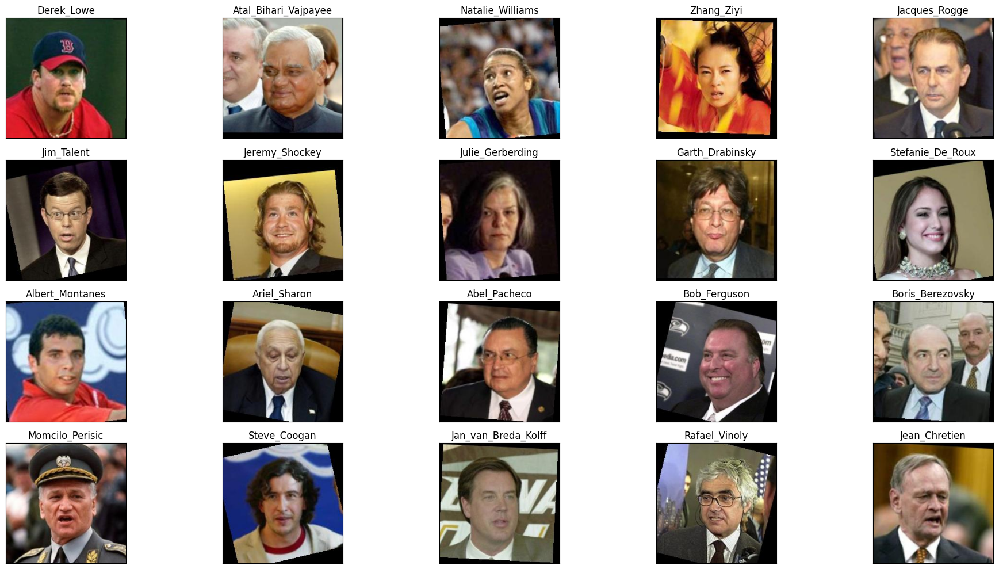

In [14]:
sampled_id = []

plt.figure(figsize=(20,10))
for i in range(20):
    idx = random.randint(0, len(dataset))
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
    sampled_id.append(idx)
plt.tight_layout()
plt.show()

The following cell shows the images with some of the background removed.

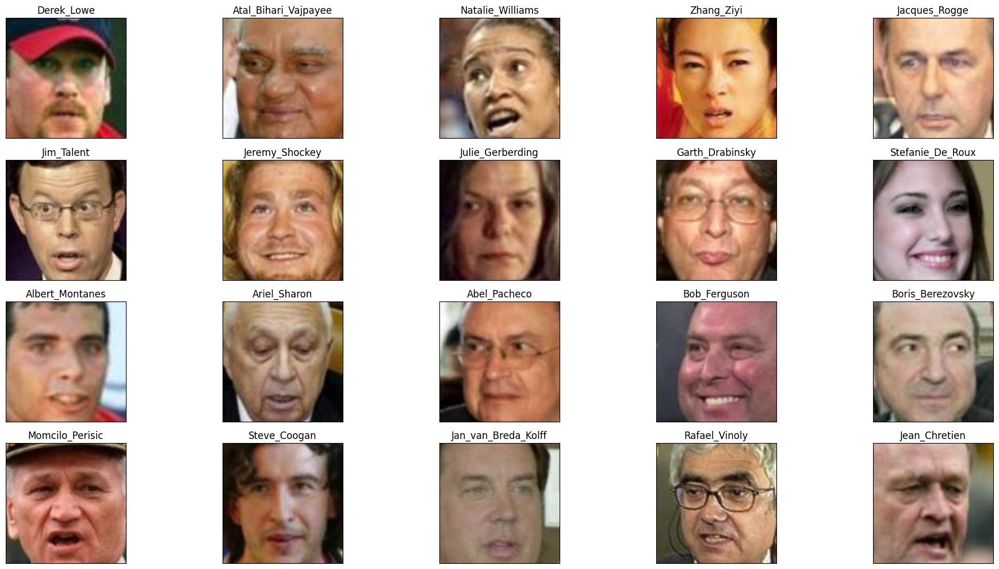

In [15]:
dx=70
dy=70

plt.figure(figsize=(20,10))
for i in range(20):
    idx = sampled_id[i]
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img[dy:-dy,dx:-dx])
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

The following function crops the images to 45x45 pixels, which is what we will use in this problem.

In [20]:
from pathlib import Path
def fetch_dataset(dx=70, dy=70, dimx=45, dimy=45, limit=500):
    """
    Load and preprocess a subset of the face dataset.

    Parameters
    ----------
    dx, dy : int
        Pixel margins to crop from the left/right (dx) and top/bottom (dy).
    dimx, dimy : int
        Output image resolution after resizing.
    limit : int
        Maximum number of images to load (useful for quick testing).

    Returns
    -------
    all_photos : np.ndarray
        Array of processed images with shape (N, dimx, dimy, 3).
    all_attrs : pd.DataFrame
      Corresponding attribute values for each image.
     """

    # 1. Load attributes
    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1)
    df_attrs = pd.DataFrame(df_attrs.iloc[:, :-1].values, columns=df_attrs.columns[1:])

    # 2. Build photo list
    records = []
    for img_path in Path(DATASET_PATH).rglob("*.jpg"):
        fname = img_path.stem.replace("_", " ")
        parts = fname.split()
        person = " ".join(parts[:-1])
        imagenum = int(parts[-1])
        records.append({"person": person, "imagenum": imagenum, "photo_path": str(img_path)})

    photo_ids = pd.DataFrame(records)

    # 3. Merge attributes with paths
    df = pd.merge(df_attrs, photo_ids, on=("person", "imagenum"))
    assert len(df) == len(df_attrs), "lost some data when merging dataframes"

    # Limit number of images
    if limit is not None:
        df = df.iloc[:limit].copy()

    # 4. Vectorized image processing
    def process_image(path):
        with Image.open(path) as im:
            im = im.convert("RGB")
            w, h = im.size
            im = im.crop((dx, dy, w - dx, h - dy))
            im = im.resize((dimx, dimy), Image.LANCZOS)
            return np.array(im, dtype=np.uint8)

    all_photos = np.stack([process_image(p) for p in df["photo_path"]])
    all_attrs = df.drop(columns=["photo_path", "person", "imagenum"])

    return all_photos, all_attrs

The variable `data` has all the face images and the variable `attrs` has all the attributes. The 8-bit RGB values are converted to values between 0 and 1 for modeling and plotting purposes.

In [21]:
data, attrs = fetch_dataset()
data = np.array(data / 255, dtype='float32')

### Create Face Groups

We can now create groups of faces, by selecting the faces having the highest or lowest scores for each of the attributes. Run all the cells in this section to create and plot some face groups.

In [22]:
def plot_gallery(images, h, w, n_row=3, n_col=6, with_title=False, titles=[]):
    plt.figure(figsize=(1.75 * n_col, 2 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        try:
            plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
            if with_title:
                plt.title(titles[i])
            plt.xticks(())
            plt.yticks(())
        except:
            pass

In [23]:
IMAGE_H = data.shape[1]
IMAGE_W = data.shape[2]
N_CHANNELS = 3

In [24]:
smile_ids = attrs['Smiling'].sort_values(ascending=False).head(36).index.values
smile_data = data[smile_ids]

no_smile_ids = attrs['Smiling'].sort_values(ascending=True).head(36).index.values
no_smile_data = data[no_smile_ids]

eyeglasses_ids = attrs['Eyeglasses'].sort_values(ascending=False).head(36).index.values
eyeglasses_data = data[eyeglasses_ids]

sunglasses_ids = attrs['Sunglasses'].sort_values(ascending=False).head(36).index.values
sunglasses_data = data[sunglasses_ids]

mustache_ids = attrs['Mustache'].sort_values(ascending=False).head(36).index.values
mustache_data = data[mustache_ids]

male_ids = attrs['Male'].sort_values(ascending=False).head(36).index.values
male_data = data[male_ids]

female_ids = attrs['Male'].sort_values(ascending=True).head(36).index.values
female_data = data[female_ids]

eyeclosed_ids = attrs['Eyes Open'].sort_values(ascending=True).head(36).index.values
eyeclosed_data = data[eyeclosed_ids]

mouthopen_ids = attrs['Mouth Wide Open'].sort_values(ascending=False).head(36).index.values
mouthopen_data = data[mouthopen_ids]

makeup_ids = attrs['Heavy Makeup'].sort_values(ascending=False).head(36).index.values
makeup_data = data[makeup_ids]

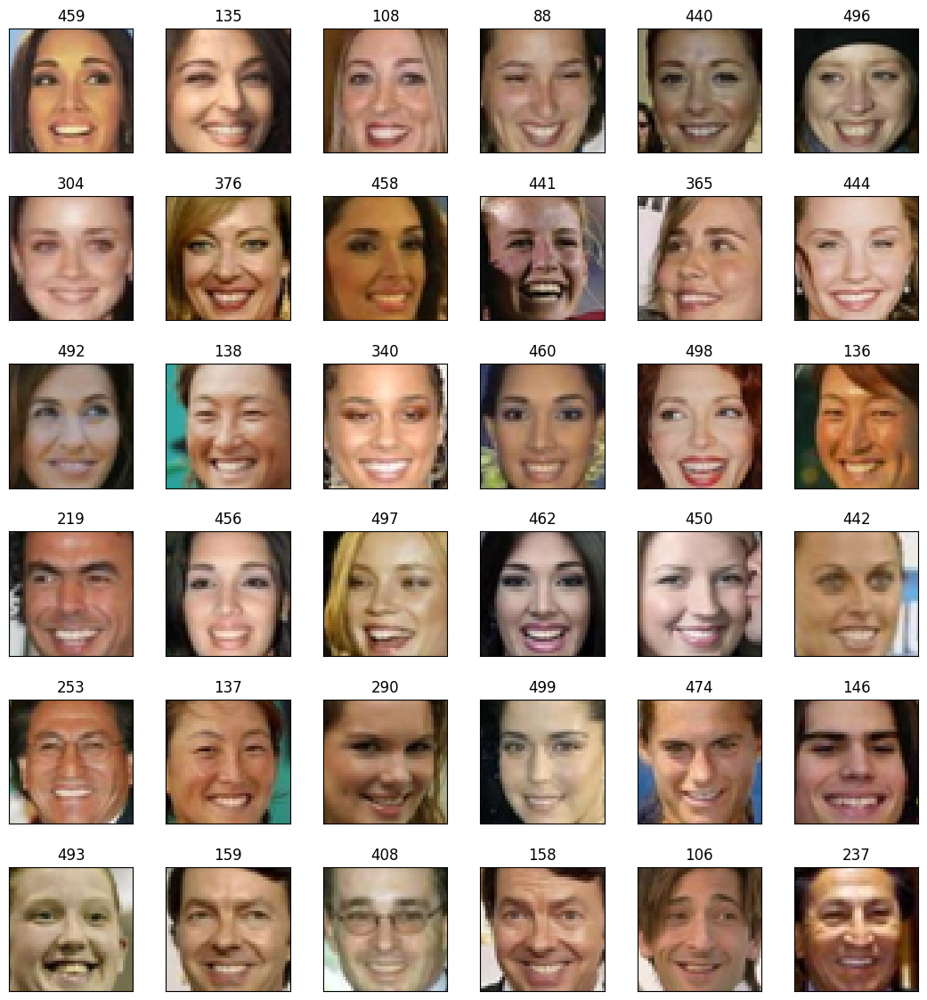

In [25]:
plot_gallery(smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=smile_ids)

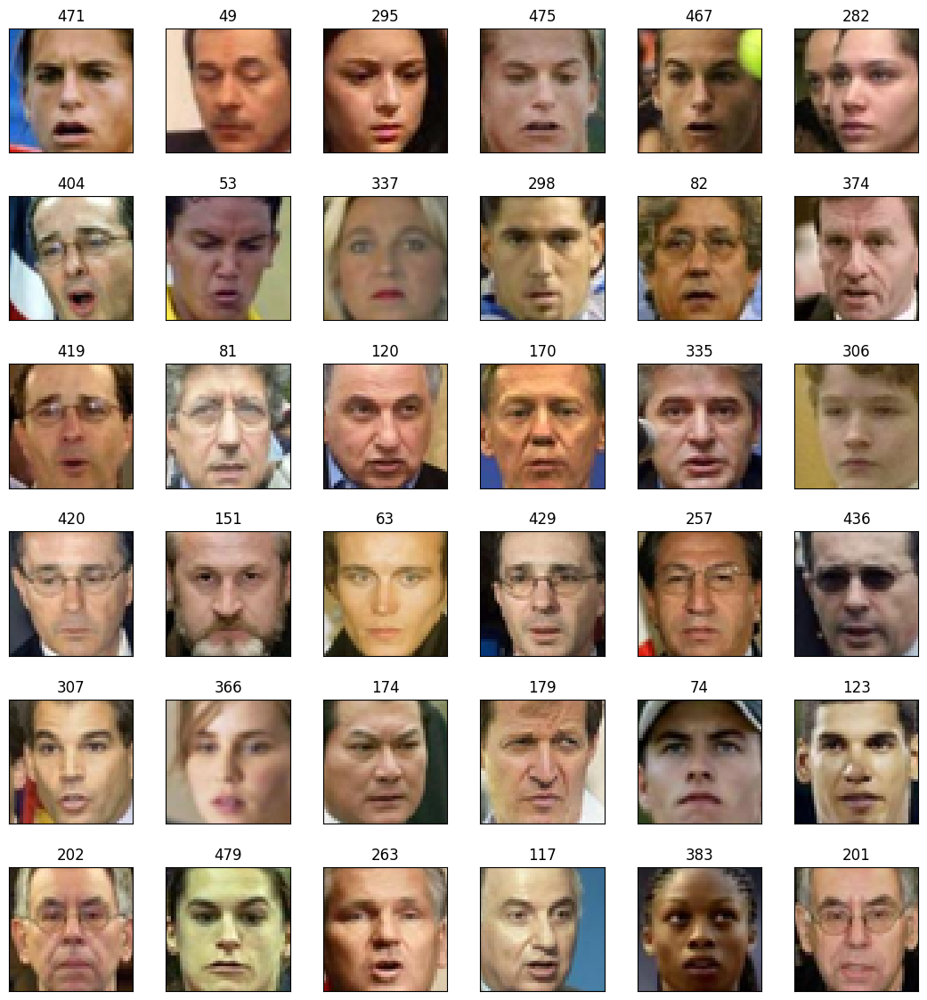

In [26]:
plot_gallery(no_smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=no_smile_ids)

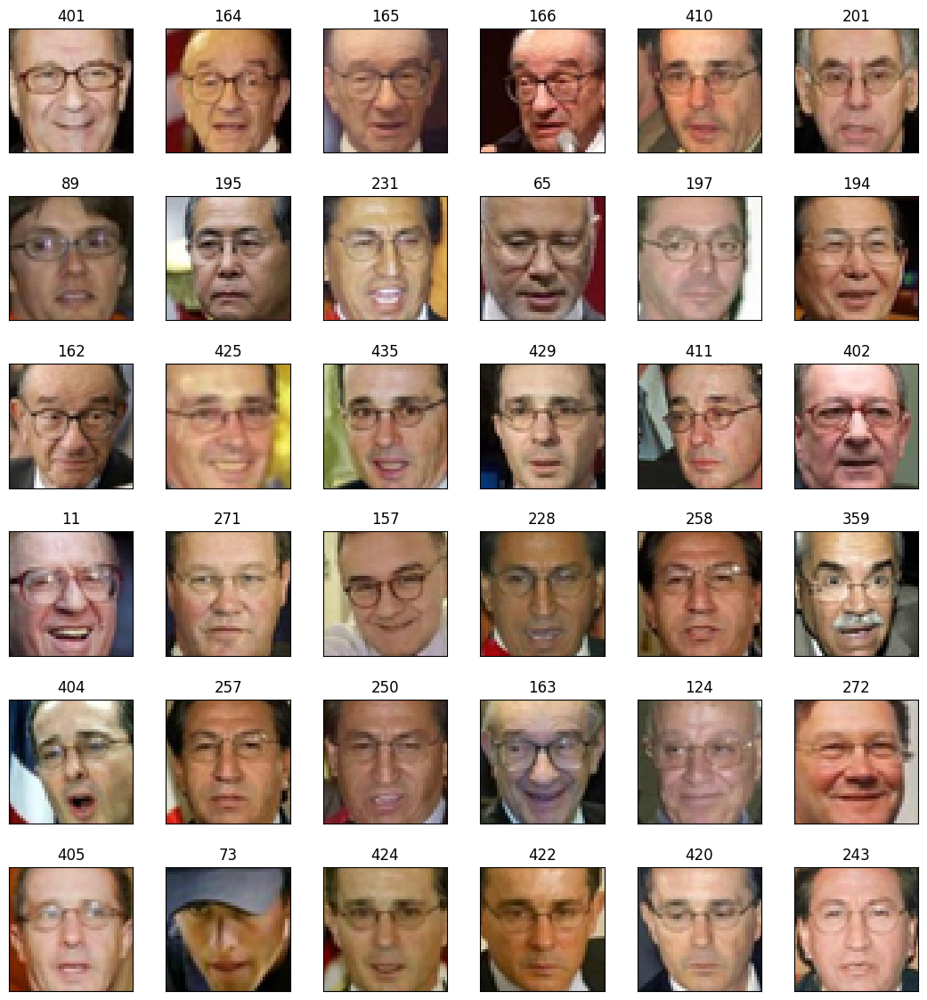

In [27]:
plot_gallery(eyeglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeglasses_ids)

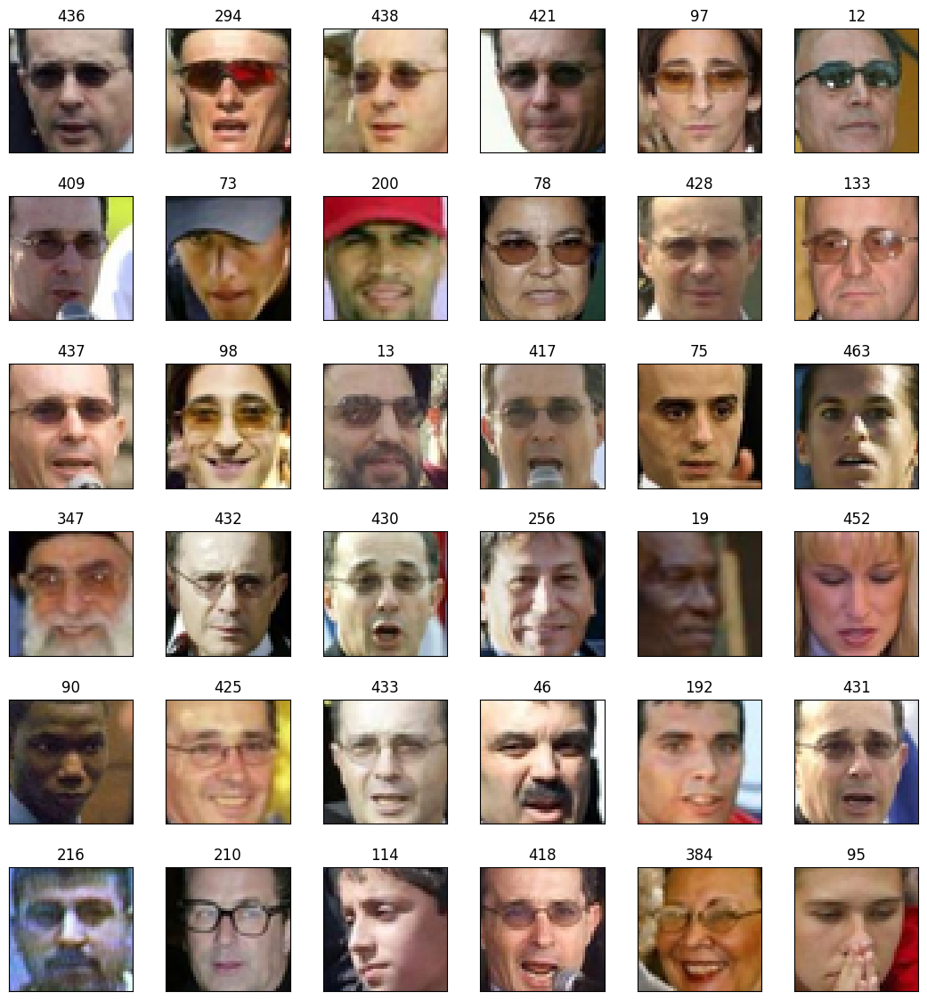

In [28]:
plot_gallery(sunglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=sunglasses_ids)

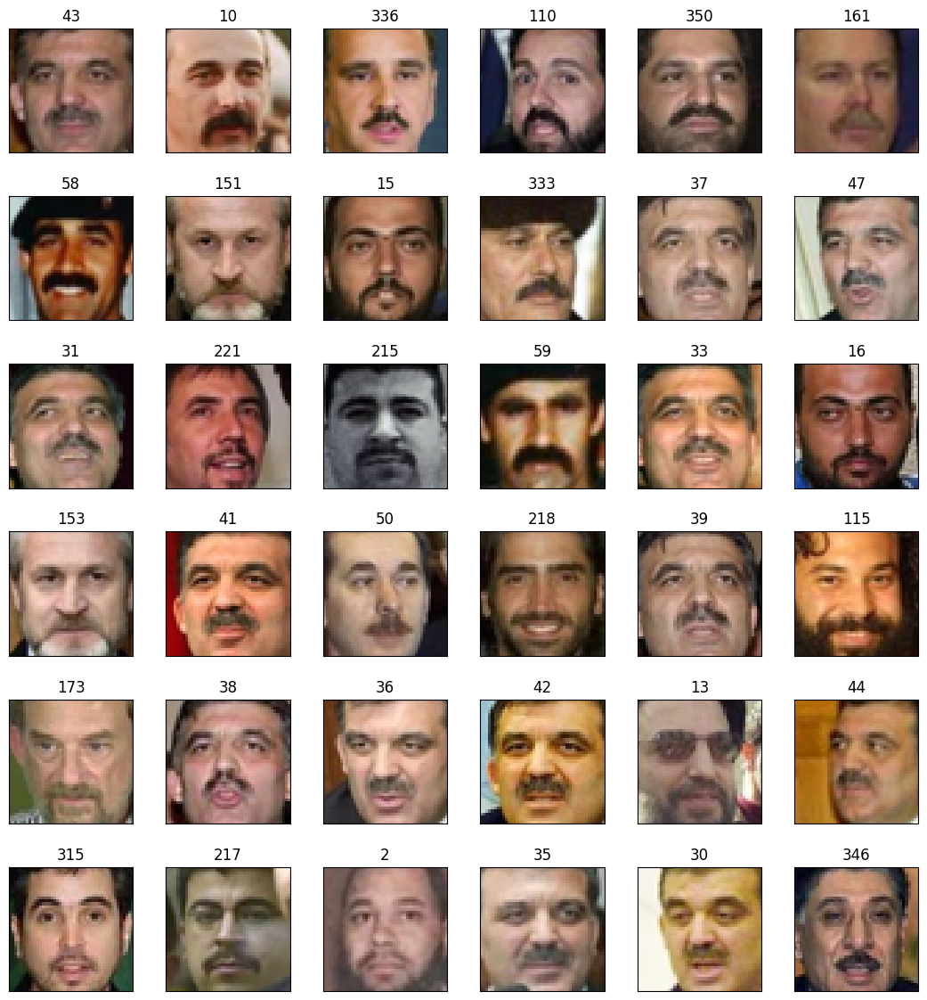

In [29]:
plot_gallery(mustache_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mustache_ids)

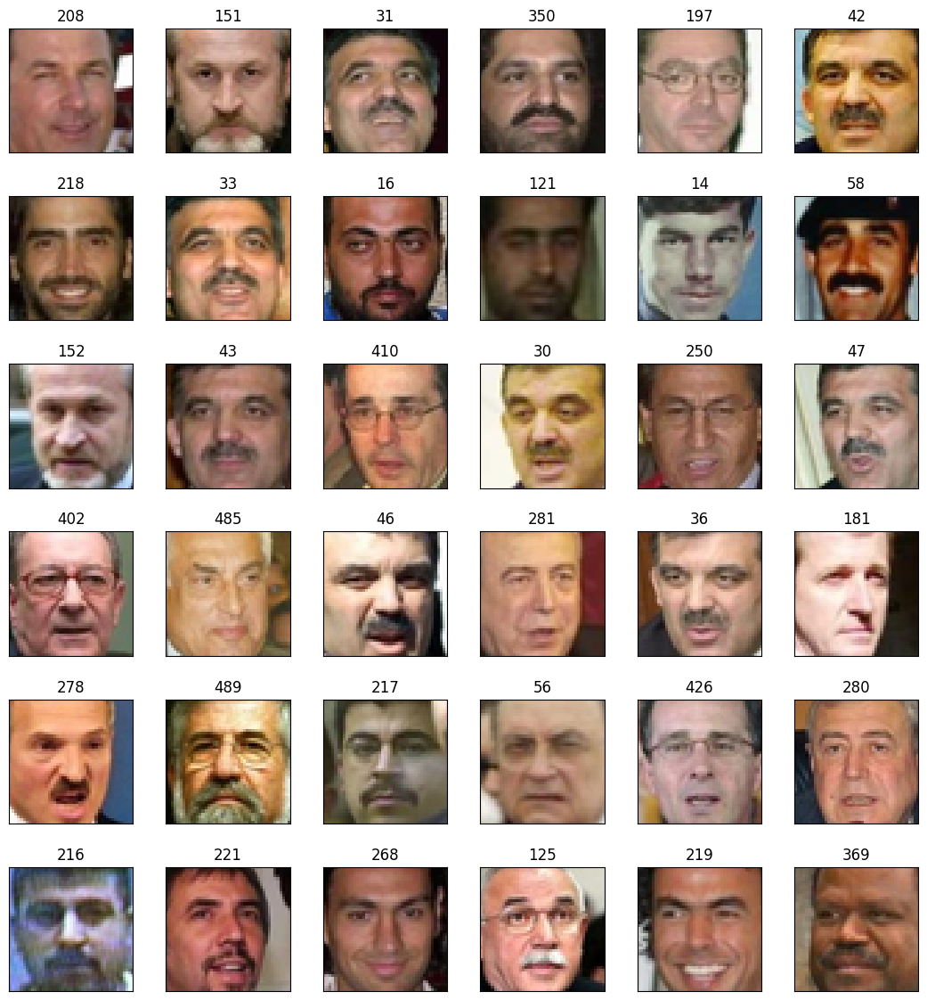

In [30]:
plot_gallery(male_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=male_ids)

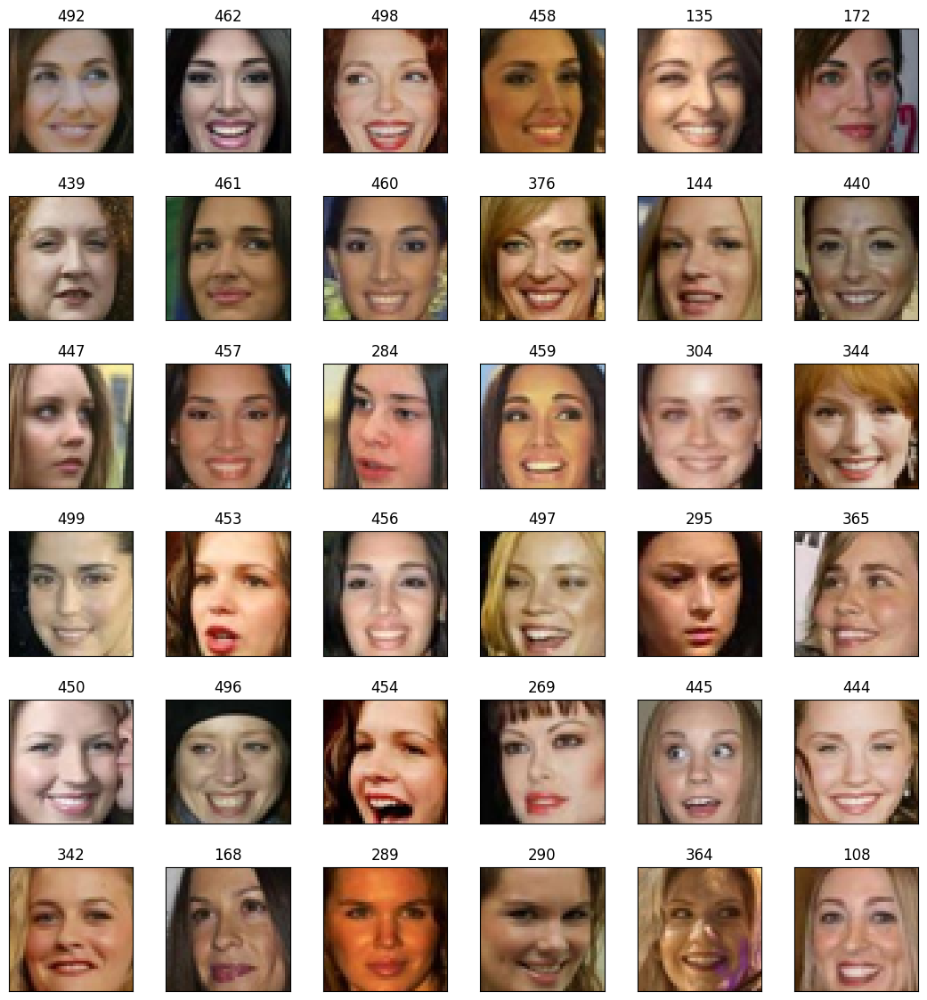

In [31]:
plot_gallery(female_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=female_ids)

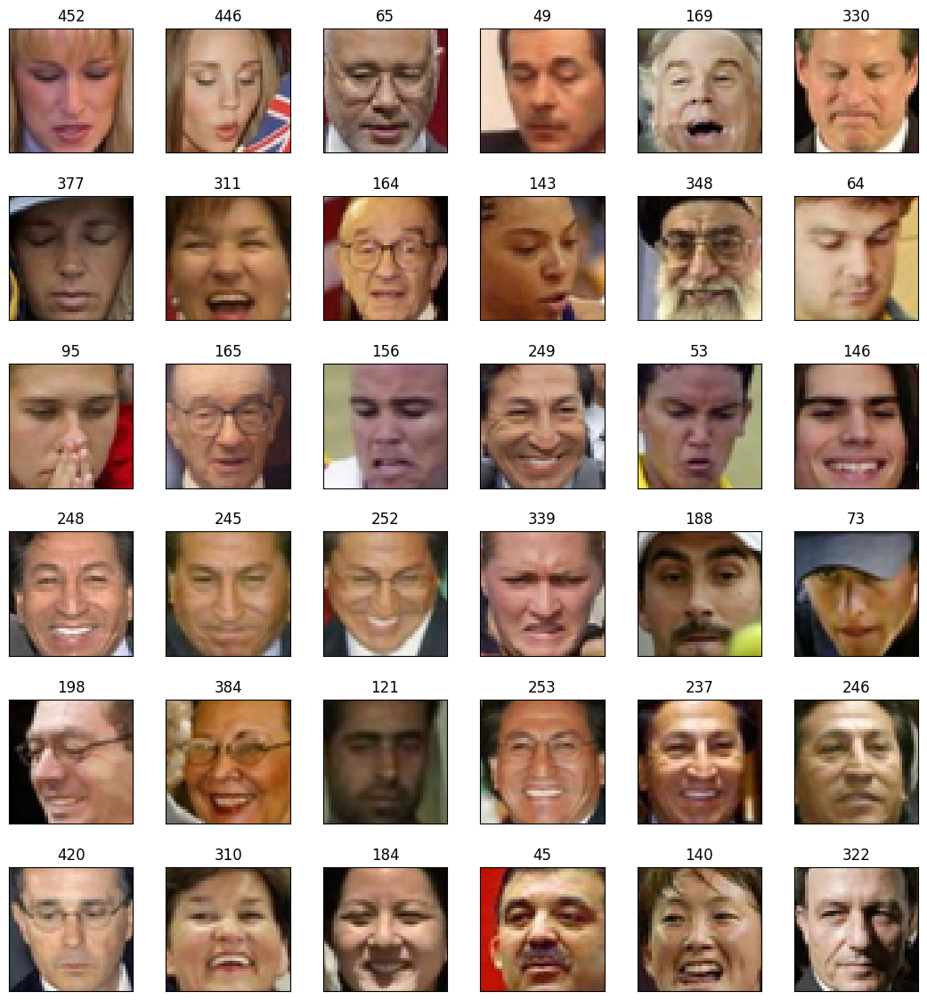

In [32]:
plot_gallery(eyeclosed_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeclosed_ids)

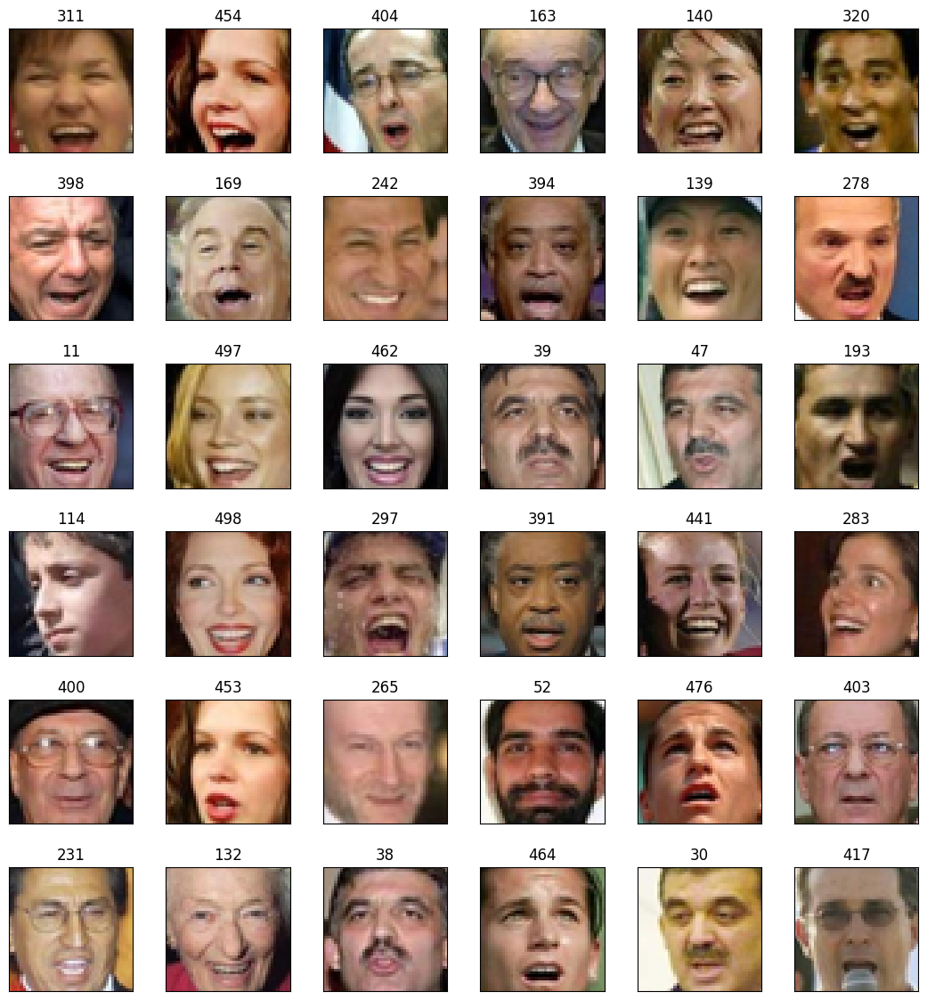

In [33]:
plot_gallery(mouthopen_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mouthopen_ids)

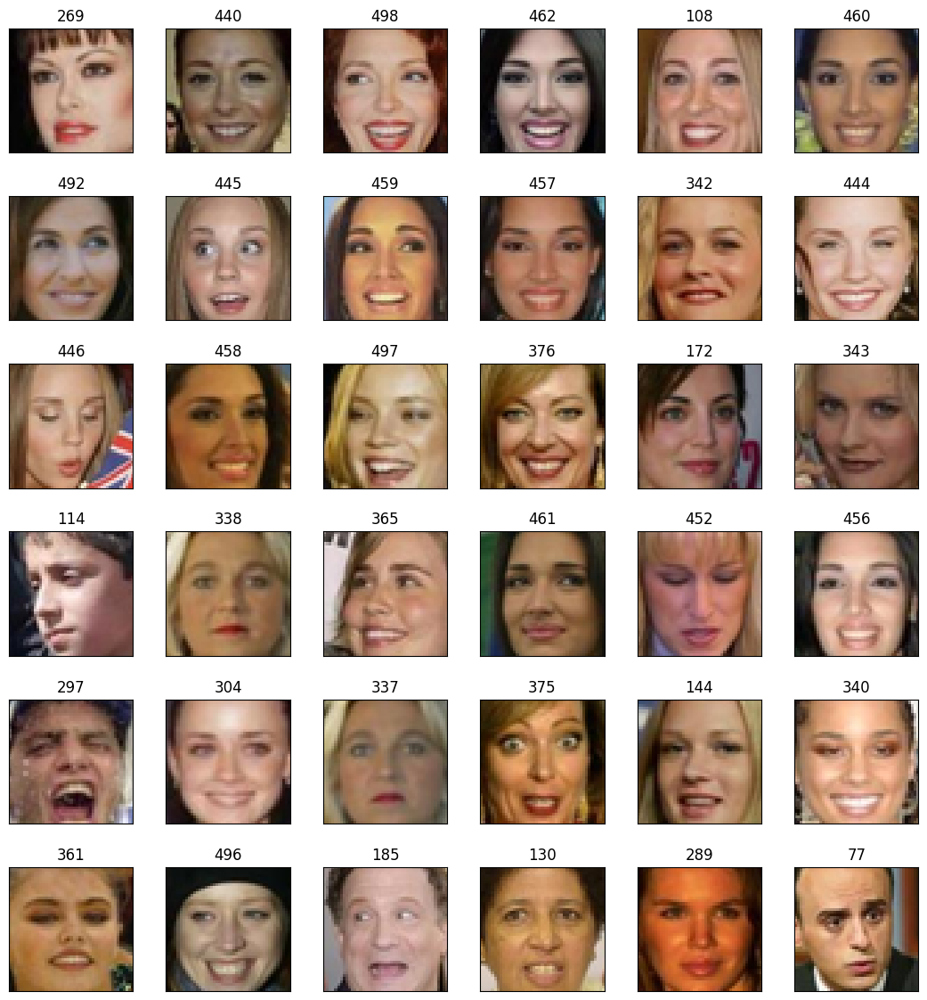

In [34]:
plot_gallery(makeup_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=makeup_ids)

### Constructing the encoder

Recall that the encoder part of the VAE architecture maps a data point to a variational mean and (log) variance. The mean is a point in the latent space.


In [35]:
LATENT_SPACE_SIZE = 100

The "reparameterization trick" draws samples from the variational distribution that are parameterized by the variational mean and variance, so that the parameters of the encoder network can be trained.


In [36]:
def sample_latent_features(distribution):
    distribution_mean, distribution_variance = distribution
    batch_size = tensorflow.shape(distribution_variance)[0]
    random = tensorflow.keras.backend.random_normal(shape=(batch_size, tensorflow.shape(distribution_variance)[1]))
    return distribution_mean + tensorflow.exp(0.5 * distribution_variance) * random

In [37]:
input_data = tensorflow.keras.layers.Input(shape=(45, 45, 3))

encoder = tensorflow.keras.layers.Conv2D(64, (5,5), activation='relu')(input_data)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(64, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(32, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Flatten()(encoder)

distribution_mean = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_mean')(encoder)
distribution_variance = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_log_variance')(encoder)
latent_encoding = tensorflow.keras.layers.Lambda(sample_latent_features)([distribution_mean, distribution_variance])

encoder_model = tensorflow.keras.Model(input_data, latent_encoding)
encoder_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 45, 45, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 41, 41,    │      4,864 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 20, 20,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 18, 18,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 9, 9, 64)  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 32)  │     18,464 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 3, 32)  │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 288)       │          0 │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_mean    │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_log_va… │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 100)       │          0 │ variational_mean… │
│                     │                   │            │ variational_log_… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 118,056 (461.16 KB)

 Trainable params: 118,056 (461.16 KB)

 Non-trainable params: 0 (0.00 B)

### Construct the decoder

The decoder network in the VAE architecture maps a latent vector to an image.
This is done with a series of transposed convolutional layers, since it must
map from low to high dimensions.


In [38]:
decoder_input = tensorflow.keras.layers.Input(shape=(LATENT_SPACE_SIZE,))
decoder = tensorflow.keras.layers.Reshape((1, 1, 100))(decoder_input)
decoder = tensorflow.keras.layers.Conv2DTranspose(64, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(32, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(16, (5,5), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder_output = tensorflow.keras.layers.Conv2DTranspose(3, (6,6), activation='relu')(decoder)

decoder_model = tensorflow.keras.Model(decoder_input, decoder_output)
decoder_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 1, 1, 100)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 3, 3, 64)       │        57,664 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 8, 8, 32)       │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 20, 20, 16)     │        12,816 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 40, 40, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 45, 45, 3)      │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 90,675 (354.20 KB)

 Trainable params: 90,675 (354.20 KB)

 Non-trainable params: 0 (0.00 B)

In [39]:
encoded = encoder_model(input_data)
decoded = decoder_model(encoded)
autoencoder = tensorflow.keras.models.Model(input_data, decoded)

In [40]:
def get_loss(distribution_mean, distribution_variance, factor, batch_size):

    def get_reconstruction_loss(y_true, y_pred, factor, batch_size):
        reconstruction_loss = tensorflow.math.squared_difference(y_true, y_pred)
        reconstruction_loss_batch = tensorflow.reduce_sum(reconstruction_loss)/batch_size
        return 0.5*reconstruction_loss_batch*factor

    def get_kl_loss(distribution_mean, distribution_variance, batch_size):
        kl_loss = LATENT_SPACE_SIZE + distribution_variance - tensorflow.square(distribution_mean) - tensorflow.exp(distribution_variance)
        kl_loss_batch = tensorflow.reduce_sum(kl_loss)/batch_size
        return kl_loss_batch*(-0.5)

    def total_loss(y_true, y_pred):
        reconstruction_loss_batch = get_reconstruction_loss(y_true, y_pred, factor, batch_size)
        kl_loss_batch = get_kl_loss(distribution_mean, distribution_variance, batch_size)
        return reconstruction_loss_batch + kl_loss_batch

    return total_loss

In [41]:
from keras import ops, layers, Model
from keras.losses import mean_squared_error as mse

# --- KL layer ---
class KLLoss(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        # KL per sample: -0.5 * sum(1 + logvar - mu^2 - exp(logvar))
        kl_per_sample = -0.5 * ops.sum(1.0 + logvar - ops.square(mu) - ops.exp(logvar), axis=-1)
        self.add_loss(ops.mean(kl_per_sample))  # scalar KL
        return inputs  # pass-through

# 1) Create the KL node
kl_node = KLLoss(name="kl_loss")([distribution_mean, distribution_variance])

# 2) Tie the KL node into the forward graph but keep output = decoded
decoded = layers.Lambda(lambda xs: xs[0], name="with_kl")([decoded, kl_node])

# 3) (Re)build the model so the KL loss is included
autoencoder = tensorflow.keras.models.Model(input_data, decoded, name="autoencoder_with_kl")

# 4) reconstruction loss
def reconstruction_loss(y_true, y_pred, sum_over_channels=False):
    # per-pixel MSE (averaged over channels)
    per_pixel = mse(y_true, y_pred)                 # (B, H, W)
    H = ops.shape(per_pixel)[1]
    W = ops.shape(per_pixel)[2]
    factor = ops.cast(H * W, per_pixel.dtype)
    if sum_over_channels:
        C = ops.shape(y_true)[-1]                   # undo the channel mean
        factor = factor * ops.cast(C, per_pixel.dtype)
    return ops.mean(per_pixel) * factor             # mean over batch, sum over chosen dims

### 1.1 Deriving the loss function (5 points)

Derive the loss function defined in the cell above from the probability model perspective. You can ignore the scalar `factor` in your derivation. Show your work using either LaTeX or a picture of your written solution.

Hint: Think about how how the total loss is related to the ELBO.

**Generative model.**  
Let the latent prior and conditional observation model be  
$$
p_\theta(z) = \mathcal{N}(0, I), \qquad
p_\theta(x \mid z) = \mathcal{N}(f_\theta(z),\, \sigma^2 I)
$$

**Variational posterior.**  
We approximate the true posterior with  
$$
q_\phi(z \mid x) = \mathcal{N}(\mu_\phi(x),\, \mathrm{diag}(\sigma_\phi^2(x))),
$$  
where in the code  
$\texttt{distribution\_mean} = \mu_\phi(x)$  
and  
$\texttt{distribution\_log\_variance} = \log \sigma_\phi^2(x)$.

---

**Evidence Lower Bound (ELBO).**  
For any $q_\phi(z \mid x)$,  
$$
\log p_\theta(x)
\ge \mathbb{E}_{q_\phi(z \mid x)}[\log p_\theta(x \mid z)]
- \mathrm{KL}(q_\phi(z \mid x)\,\|\,p_\theta(z))
= \mathcal{L}(\theta, \phi; x)
$$

Training maximizes the ELBO.  
Equivalently, we minimize its negative:  
$$
\mathcal{J}(\theta, \phi; x)
= -\mathbb{E}_{q_\phi(z \mid x)}[\log p_\theta(x \mid z)]
+ \mathrm{KL}(q_\phi(z \mid x)\,\|\,p_\theta(z))
$$

---

**Reconstruction term (Gaussian likelihood → MSE).**  
Because $p_\theta(x \mid z) = \mathcal{N}(f_\theta(z), \sigma^2 I)$,  
$$
-\log p_\theta(x \mid z)
= \frac{1}{2\sigma^2}\|x - f_\theta(z)\|_2^2 + \text{const}
$$

Taking the expectation and ignoring the scalar factor (as allowed):  
$$
-\mathbb{E}_{q_\phi}[\log p_\theta(x \mid z)]
\propto
\mathbb{E}_{q_\phi}[\|x - f_\theta(z)\|_2^2]
\approx \|x - \hat{x}\|_2^2
$$
which corresponds to the **per-pixel MSE reconstruction loss** in your code.

---

**KL term (Gaussian–Gaussian closed form).**  
For $q_\phi = \mathcal{N}(\mu,\,\mathrm{diag}(\sigma^2))$ and $p = \mathcal{N}(0, I)$:  
$$
\mathrm{KL}(q_\phi\,\|\,p)
= \frac{1}{2}\sum_{j=1}^{d}(\mu_j^2 + \sigma_j^2 - \log\sigma_j^2 - 1)
= \frac{1}{2}\sum_{j=1}^{d}(\mu_j^2 + e^{\log\sigma_j^2} - \log\sigma_j^2 - 1)
$$

This matches your code expression:  
`-0.5 * sum(1 + logvar - mu^2 - exp(logvar))`

---

**Putting it together.**  
Ignoring constants and scalar factors, the total loss is  
$$
\boxed{
\mathcal{J}(\theta, \phi; x)
\propto
\underbrace{\|x - \hat{x}\|_2^2}_{\text{Reconstruction (MSE)}} +
\underbrace{\tfrac{1}{2}\sum_{j=1}^d(\mu_j^2 + e^{\log\sigma_j^2} - \log\sigma_j^2 - 1)}_{\text{KL}(q_\phi\|p)}
}
$$

where $\hat{x} = f_\theta(z)$ and $z = \mu + \sigma \odot \epsilon$,  
with $\epsilon \sim \mathcal{N}(0, I)$ (the *reparameterization trick*).  

---

**Code correspondence:**  
- Reconstruction loss → `reconstruction_loss` (based on `mse`)  
- KL loss → `KLLoss.add_loss(...)`  
- Multiplying by a coefficient (β) yields the β-VAE version,  
  but this problem states you can ignore the scalar factor.


The following three cells train the model. You can just run them. It may take a while to run on your laptop.

In [42]:
X_train, X_val = train_test_split(data, test_size=0.2, random_state=365)

In [43]:
batch_size = 64
# autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100,
#                                   batch_size = batch_size), optimizer='adam')
autoencoder.compile(optimizer="adam", loss=reconstruction_loss)

autoencoder.summary()

Model: "autoencoder_with_kl"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 45, 45, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 41, 41,    │      4,864 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 20, 20,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 18, 18,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 9, 9, 64)  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 32)  │     18,464 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 3, 32)  │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 288)       │          0 │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ (None, 100)       │    118,056 │ input_layer[0][0] │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_mean    │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_log_va… │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 45, 45, 3) │     90,675 │ functional[0][0]  │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ kl_loss (KLLoss)    │ [(None, 100),     │          0 │ variational_mean… │
│                     │ (None, 100)]      │            │ variational_log_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ with_kl (Lambda)    │ (None, 45, 45, 3) │          0 │ functional_1[0][… │
│                     │                   │            │ kl_loss[0][0],    │
│                     │                   │            │ kl_loss[0][1]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 208,731 (815.36 KB)

 Trainable params: 208,731 (815.36 KB)

 Non-trainable params: 0 (0.00 B)

In [44]:
autoencoder.fit(X_train, X_train, epochs=50, batch_size=64, validation_data=(X_val, X_val))

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - loss: 355.5966 - val_loss: 213.7898
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 839ms/step - loss: 197.9768 - val_loss: 150.7956
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 601ms/step - loss: 145.9113 - val_loss: 121.4947
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 825ms/step - loss: 122.6423 - val_loss: 111.8521
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 613ms/step - loss: 111.8009 - val_loss: 101.2648
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 724ms/step - loss: 104.4108 - val_loss: 95.6967
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 595ms/step - loss: 98.8374 - val_loss: 88.9197
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 730ms/step - loss: 94.5897 - val_loss: 85.9884
Epoch 9/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 603ms/step - loss: 92.3612 - val_loss: 83.0440
Epoch 10/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 589ms/step - loss: 92.4560 - val_loss: 82.0887
Epoch 11/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 815ms/step - loss: 88.0012 - val_loss: 82.9710
Epoch 12/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 586

In [47]:
# Save your trained model (for later use)

autoencoder.save("/content/My_Trained_VAE.keras")
encoder_model.save("/content/My_Trained_encoder.keras")
decoder_model.save("/content/My_Trained_decoder.keras")

If you experience issues while training the models above or if the process is taking too long, you may also use our pre-trained versions of the VAE, encoder, and decoder, which are available on Canvas.

No points will be taken off if you decide to use the pre-trained models, but we do recommend trying out the training process above. In case you encounter any issues when loading in the models, please post your questions on Ed discussion.

In [ ]:
# Load Pre-trained Model

# batch_size = 64
# autoencoder = tensorflow.keras.models.load_model("Trained_VAE",compile=False)
# autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

# encoder_model = tensorflow.keras.models.load_model("Trained_encoder",compile=False)
# encoder_model.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

# decoder_model = tensorflow.keras.models.load_model("Trained_decoder",compile=False)
# decoder_model.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

### 1.2 Reconstructing faces (3 points)

The following cell encodes and reconstructs 16 random faces from the validation set with the trained VAE. Run the cell and comment on the reconstructed faces. (3 points)
* Do the reconstructed faces resemble the original images? How are they similar/different?
* Are there any faces that are reconstructed better or worse than the others? Can you think of why?
* Comment on any other aspects of your findings that are interesting to you.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


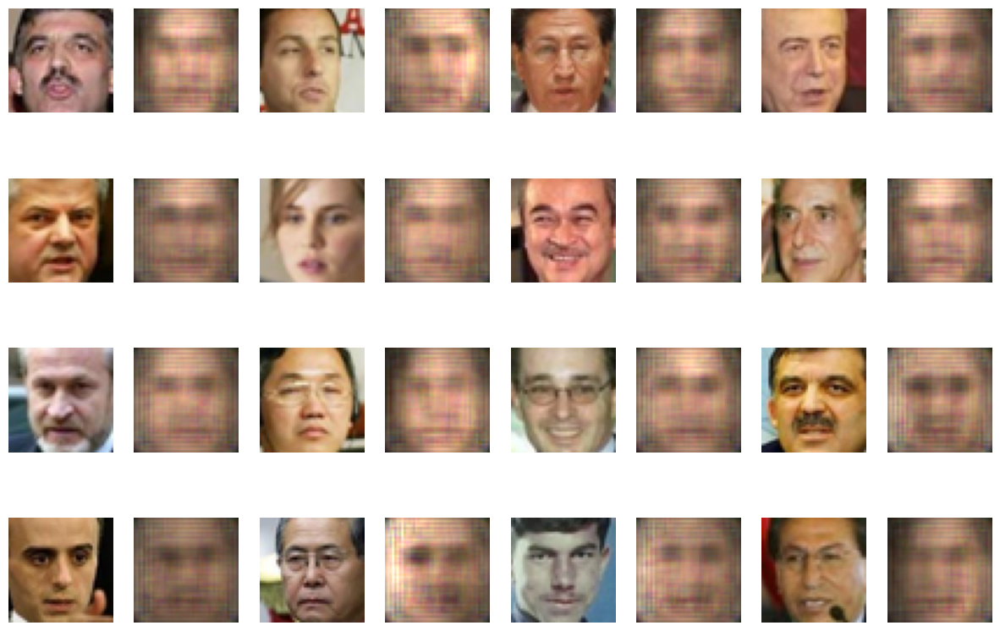

In [48]:
sample_index = random.sample(range(1, len(X_val)), 16)

fig, axs = plt.subplots(4, 8)
fig.set_figheight(10)
fig.set_figwidth(15)

for i in range(4):
    for j in range(4):
        axs[i, 2*j].imshow(X_val[sample_index[4*i+j], :, :, :])
        axs[i, 2*j].axis('off')
        axs[i, 2*j+1].imshow(np.clip(autoencoder.predict(np.array([X_val[sample_index[4*i+j], :, :, :]]))[0],0,1))
        axs[i, 2*j+1].axis('off')

The reconstructed faces generally resemble the original images in overall shape, pose, and facial layout. The VAE successfully captures the coarse structure of the faces, but most reconstructions appear noticeably blurred and lack sharp details such as eyes, hairlines, and wrinkles. This blurriness arises because the model minimizes pixel-wise MSE, which tends to average out high-frequency textures.

Some faces (especially those that are front-facing and well-lit) are reconstructed more accurately, while faces with glasses, strong poses, or unusual lighting look less realistic. This variation likely reflects both the limited latent space size (100 dimensions) and the small input resolution (45×45 pixels).

Overall, the VAE demonstrates a meaningful latent representation of facial structure, though the simplicity of the model restricts fine-grained detail reconstruction.


### 1.3 Visualizing the latent space (10 points)

In `vae_demo` from class, the MNIST digits were generated from a two-dimensional latent space. In the current model, the latent space has more than two dimensions, so to visualize it we need to use a dimensionality reduction technique. (If you are not familiar with PCA, please refer to the material for Week 7 of [iML](https://ydata123.org/fa21/iml/calendar.html).)

In this problem, you will first implement the function `LatentSpace_2D`. (6 points)
1. Calculate the latent space encodings for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Use PCA to reduce the dimension of the latent space codes to two.
3. Visualize the latent space after dimensionality reduction with a scatter plot. Clearly color-code and label the two different groups.

Here is an example using smile_data and no_smile_data.
![Sample_1_3](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Sample_1_3.png)

Visualize the latent space for at least three pairs of face groups including smile vs. no smile. Comment on how the scatter plots look.
* Are the two groups separable in the two-dimensional latent space? Is this what you expected? Why or why not? (2 points)
* How do the plots for the three different attributes differ from each other? (2 points)

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.decomposition import PCA

def LatentSpace_2D(encoder_model, data1, label1_str, data2, label2_str):
    """
    Encodes two datasets, applies PCA to reduce the latent space to 2D,
    and visualizes the results, colored by dataset group.

    Args:
        encoder_model (tf.keras.Model): The trained VAE encoder model.
        data1 (np.ndarray): The first input dataset.
        label1_str (str): The string label describing the first dataset (e.g., "Smile").
        data2 (np.ndarray): The second input dataset.
        label2_str (str): The string label describing the second dataset (e.g., "No Smile").
    """
    print("Encoding data...")

    # --- 1. Encode Data and Prepare for PCA ---

    # Get the mean (mu) vectors from the encoder (assuming it's the 0th element)
    # The output here will be a high-dimensional tensor, e.g., (N_samples, Z_DIM)
    z_mean_1,z_logvar = encoder_model.predict(data1 )
    z_mean_2,z_logvar = encoder_model.predict(data2 )

    # Concatenate the latent vectors
    all_z_mean = np.concatenate([z_mean_1, z_mean_2], axis=0)


    print(f"Applying PCA to reduce latent space from {all_z_mean.shape[1]}D to 2D...")

    # Initialize PCA to retain 2 principal components
    pca = PCA(n_components=2)

    # Fit PCA and transform the data
    all_z_pca = pca.fit_transform(all_z_mean)

    print(f"PCA reduced shape: {all_z_pca.shape}")
    print(f"Explained Variance Ratio (PC1, PC2): {pca.explained_variance_ratio_}")


    N1 = z_mean_1.shape[0]
    N2 = z_mean_2.shape[0]

    labels_1 = np.zeros(N1, dtype=int)
    labels_2 = np.ones(N2, dtype=int)

    all_labels = np.concatenate([labels_1, labels_2], axis=0)


    plt.figure(figsize=(12, 10))

    scatter = plt.scatter(
        all_z_pca[:, 0],    # Principal Component 1 (x-axis)
        all_z_pca[:, 1],    # Principal Component 2 (y-axis)
        c=all_labels,
        cmap='coolwarm',
        alpha=0.6,
        s=15
    )
    from sklearn.metrics import silhouette_score

    score = silhouette_score(all_z_pca, all_labels)
    print(f"Silhouette score: {score:.3f}")

    legend_handles = [
        plt.Line2D([0], [0], marker='o', color='w', label=label1_str,
                   markerfacecolor=scatter.to_rgba(0), markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label=label2_str,
                   markerfacecolor=scatter.to_rgba(1), markersize=10)
    ]

    plt.legend(handles=legend_handles, title="Dataset Labels", loc="upper right")

    plt.title('VAE Latent Space Visualization (PCA Reduced): {} vs. {}'.format(label1_str, label2_str))
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2f} Varianace)')
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2f} Varianace)')


    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

In [50]:
# Extract the μ (mean) and log(σ²) layers from the trained encoder so we can
# compute latent distributions (instead of sampling z).
mu_layer = encoder_model.get_layer("variational_mean")
logvar_layer = encoder_model.get_layer("variational_log_variance")

mu_logvar_model = tf.keras.Model(
    inputs=encoder_model.input,
    outputs=[mu_layer.output, logvar_layer.output],
    name="encoder_mu_logvar_extractor"
)

Encoding data...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Applying PCA to reduce latent space from 100D to 2D...
PCA reduced shape: (72, 2)
Explained Variance Ratio (PC1, PC2): [0.37850046 0.3008976 ]
Silhouette score: 0.003


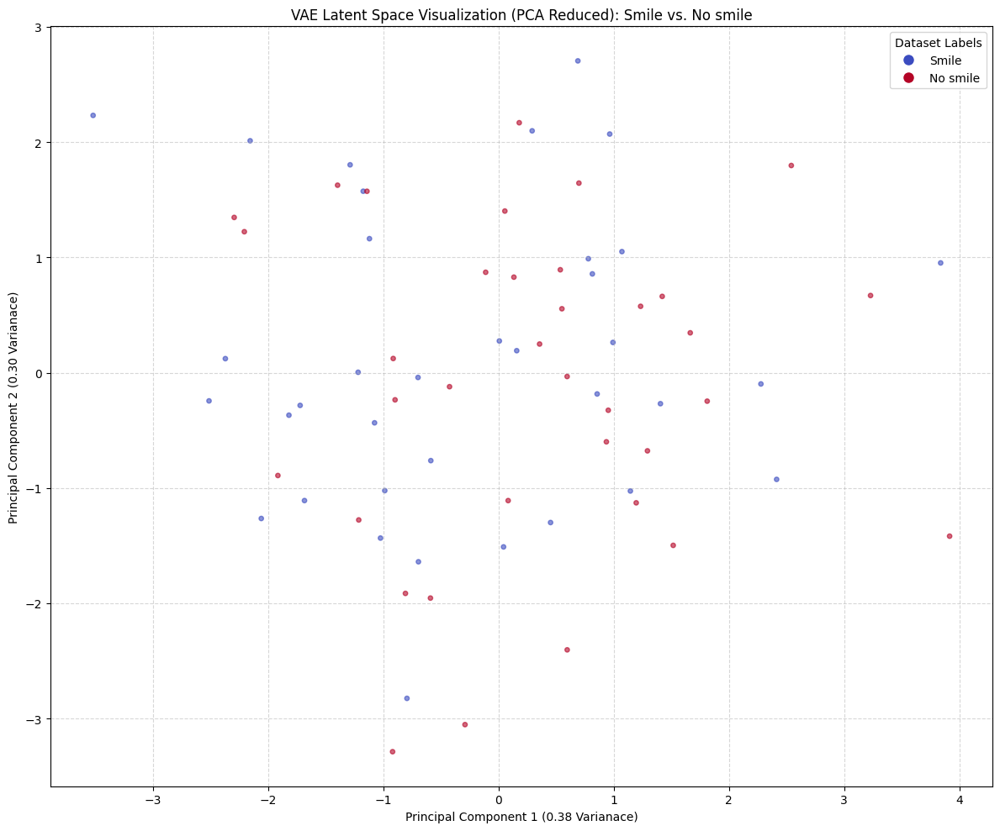

In [51]:
LatentSpace_2D(mu_logvar_model, smile_data, 'Smile', no_smile_data, 'No smile')

Encoding data...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Applying PCA to reduce latent space from 100D to 2D...
PCA reduced shape: (72, 2)
Explained Variance Ratio (PC1, PC2): [0.4505736 0.2793094]
Silhouette score: 0.059


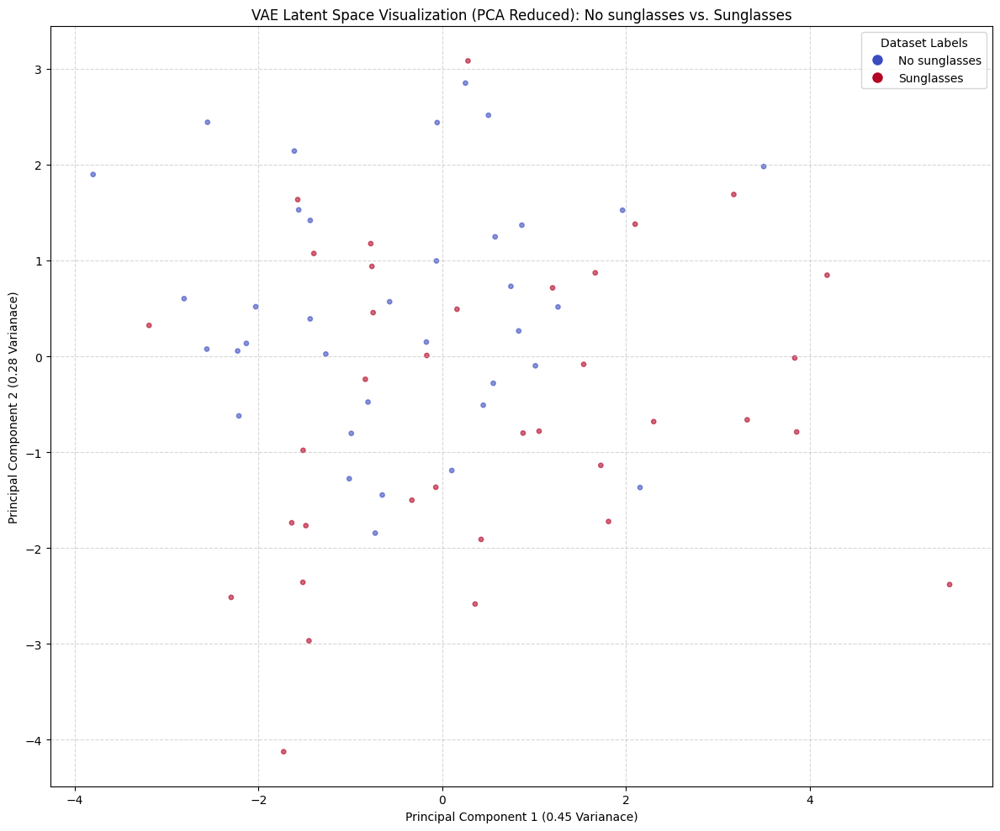

In [52]:
LatentSpace_2D(mu_logvar_model,smile_data,'No sunglasses',sunglasses_data,'Sunglasses')

Encoding data...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step 
Applying PCA to reduce latent space from 100D to 2D...
PCA reduced shape: (72, 2)
Explained Variance Ratio (PC1, PC2): [0.46518725 0.2934754 ]
Silhouette score: 0.061


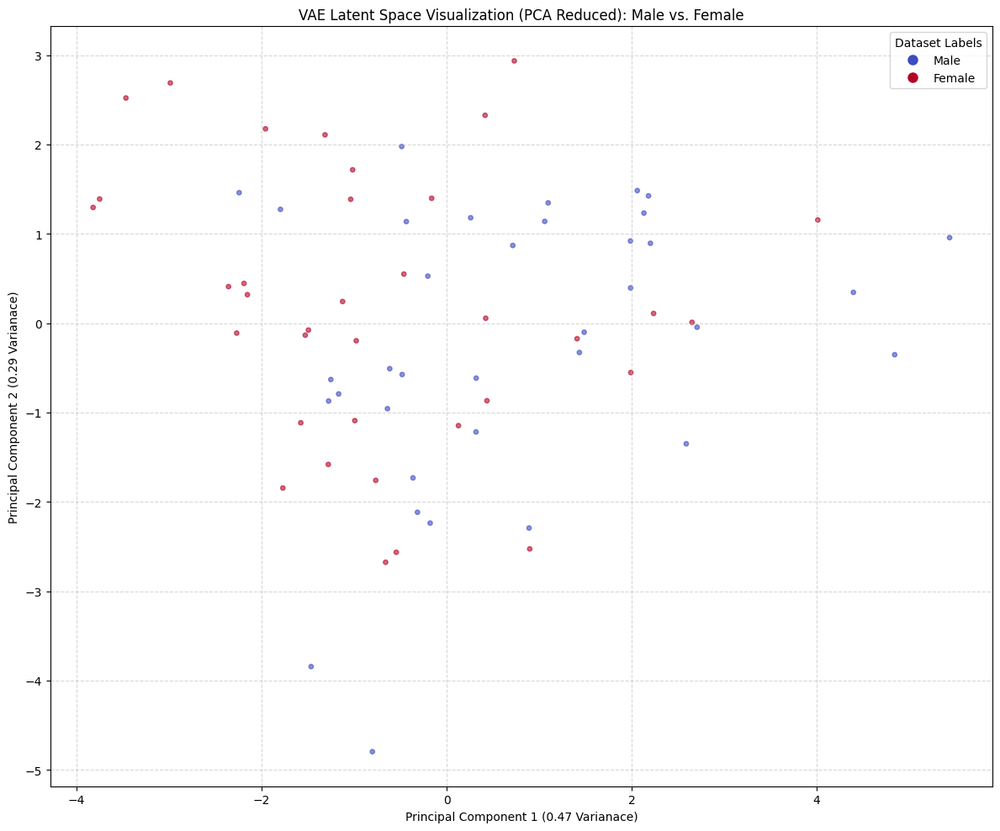

In [53]:
LatentSpace_2D(mu_logvar_model,male_data,'Male',female_data,'Female')

#### 1. Smile vs. No Smile
The points for the two groups largely overlap with no clear boundary (Silhouette = 0.003).  
This indicates that the latent representation does **not clearly separate smiling and non-smiling faces**.  
Such subtle facial expressions affect only small regions that are easily smoothed out by the low-resolution input and the VAE's coarse latent space.

#### 2. Sunglasses vs. No Sunglasses
There is **slightly more structure** (Silhouette = 0.059), though clusters are still highly mixed.  
This weak separation may occur because sunglasses cause strong color and texture changes near the eyes, which the encoder can partly capture even after compression, but not distinctly enough for clean clusters.

#### 3. Male vs. Female
The male-female plot shows **the highest separation** (Silhouette = 0.061) among the three.  
This suggests that the model learns to encode more persistent global features, such as facial shape and hair color, which correlate better with gender than with transient traits like smiling.

#### 4. Overall interpretation
Across all attributes, the groups are **not linearly separable in the 2-D PCA projection**.  
This is expected because:
- The latent space has 100 dimensions, and PCA captures only two major variance directions.  
- The VAE was trained unsupervised; attribute information was never provided explicitly.  

Thus, while some high-level semantic cues emerge, the representation primarily encodes general facial appearance rather than attribute-specific structure.


### 1.4 Morphing between faces (4 points)

Morph at least 5 pairs of faces with the function `morphBetweenImages` and comment on what you observe.
* Briefly explain how the morphing works. (2 points)
* Do the generated faces look like what you expected? Does any of the pairs work better than the others? If so, what kind of image pairs work better? (2 points)

In [54]:
# Don't change the function
def morphBetweenImages(img1, img2, num_of_morphs):
    alpha = np.linspace(0,1,num_of_morphs)
    z1 = encoder_model.predict(np.array([img1]))
    z2 = encoder_model.predict(np.array([img2]))
    fig = plt.figure(figsize=(30,5))

    ax = fig.add_subplot(1, num_of_morphs+2, 1)
    ax.imshow(img1)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 1',fontsize=10)

    for i in range(num_of_morphs):
        z = z1*(1-alpha[i]) + z2*alpha[i]
        new_img = decoder_model.predict(z)

        ax = fig.add_subplot(1, num_of_morphs+2, i+2)
        ax.imshow(np.clip(new_img.squeeze(),0,1))
        ax.axis('off')
        ax.set_title(loc='center', label='alpha={:.2f}'.format(alpha[i]))

    ax = fig.add_subplot(1, num_of_morphs+2, num_of_morphs+2)
    ax.imshow(img2)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 2',fontsize=10)
    return

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


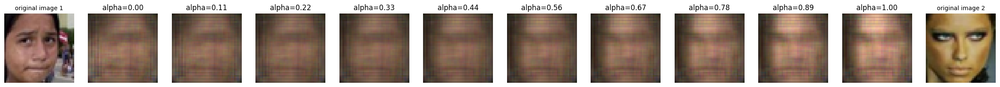

In [55]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

**How the morphing works:**  
Given two images `img1` and `img2`, we encode them into latent codes `z1` and `z2`.  
For α ∈ [0,1], we form an **interpolated latent** `z(α) = (1-α)·z1 + α·z2` and decode `z(α)` back to an image.  
This produces a sequence from `img1` (α=0) → … → `img2` (α=1).  
Intuition: the VAE's latent space organizes faces so that **linear moves** in latent coordinates produce **smooth semantic changes** after decoding.

**Observations on my results:**  
- The transitions are **smooth at the global level** (head shape, skin tone, coarse pose) but remain **blurry**, consistent with VAE + MSE smoothing.  
- Interpolations work **best** when the pair shares **similar pose, lighting, and alignment** (e.g., both near-frontal, similar illumination).  
- Pairs with **large pose differences, strong makeup/occlusions (e.g., heavy eye shadow, sunglasses), or very different backgrounds** yield less realistic intermediates—artifacts accumulate around the eyes/mouth.  
- Identity traits (gender-like cues, hairline) shift gradually across α, matching the expectation that nearby latent points encode related face features.

**Notes / why some pairs are better:**  
- Linear interpolation can pass through **low-density** regions of the latent space, causing washed-out faces.  
- Using the **mean latent** (μ) for each image (instead of stochastic samples) typically yields **cleaner** morphs; spherical interpolation (slerp) can also improve midpoints.  
- The small input resolution (45×45) and simple decoder limit fine details during the transition.


### 1.5 Attribute shift (10 points)

In 1.3, we've seen that faces with the same attributes form clusters in the latent space. In this problem, you will implement a function `AttributeShift` to change one attribute of the faces.

First implement the function `AttributeShift`. (5 points)
1. Calculate the latent space codes for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Calculate the mean latent space code for each group.
3. Get the attribute shifting vector by taking the difference between the two codes.
4. Perform attribute shift by adding the attribute shifting vector to the latent space code of the faces you want to modify.
5. Generate the image using the new latent space codes.

Here is a diagram demonstrating the shift in the latent space. Please note that the two-dimensional latent space is just for demonstration purpose. You should *not* use PCA in this problem. Instead, use the original latent space.
![Diagram_1_5](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Diagram_1_5.png)

Perform attribute shift on at three attributes including smile. Comment on the faces with shifted attributes. (5 points)
* Do the generated faces look like what you expected? If not, can you think of some possible reasons?
* Do the faces with new attributes resemble the original faces? If not, can you think of some possible reasons?
* Which of the attribute shift is more successful? What are some possible reasons?
* Comment on any other aspects of your findings that are interesting to you.

In [56]:
# Don't change this helper function!
def PlotAttributeShift(data2,pic_output):
    sample_index = random.sample(range(1, len(data2)), 16)

    fig, axs = plt.subplots(4, 8)
    fig.set_figheight(10)
    fig.set_figwidth(15)

    for i in range(4):
        for j in range(4):
            axs[i, 2*j].imshow(data2[sample_index[4*i+j], :, :, :])
            axs[i, 2*j].axis('off')
            axs[i, 2*j+1].imshow(np.clip(pic_output[sample_index[4*i+j]],0,1))
            axs[i, 2*j+1].axis('off')

In [59]:
def AttributeShift(encoder_model, decoder_model, data1, data2):
    """
    Calculates the attribute shifting vector and applies it to the latent codes
    of data2 to generate new images.

    Args:
        encoder_model (tf.keras.Model): The trained VAE encoder model.
        decoder_model (tf.keras.Model): The trained VAE decoder model.
        data1 (np.ndarray): Group 1 images (e.g., smile_data).
        data2 (np.ndarray): Group 2 images (e.g., no_smile_data, which we shift).

    Returns:
        np.ndarray: Generated images with the shifted attribute.
    """
    print("--- Starting Attribute Shift ---")

    z_code_1 = encoder_model.predict(data1)
    z_code_2 = encoder_model.predict(data2)

    # 2. Calculate the mean latent space code for each group.
    mean_z_1 = np.mean(z_code_1, axis=0)
    mean_z_2 = np.mean(z_code_2, axis=0)

    # 3. Get the attribute shifting vector (Vector 1 - Vector 2)
    # Shift: from attribute 2 (no_smile) to attribute 1 (smile)
    shift_vector = mean_z_1 - mean_z_2

    # 4. Perform attribute shift
    # Shift the second group's (data2's) latent codes toward the first group's attribute (data1)
    shifted_z_codes = z_code_2 + shift_vector

    # 5. Generate the image using the new latent space codes.
    # Pass the shifted latent codes to the decoder
    pic_output = decoder_model.predict(shifted_z_codes)

    print(f"Shift vector shape: {shift_vector.shape}")
    print("--- Attribute Shift Complete ---")

    return pic_output

--- Starting Attribute Shift ---
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step 
Shift vector shape: (100,)
--- Attribute Shift Complete ---


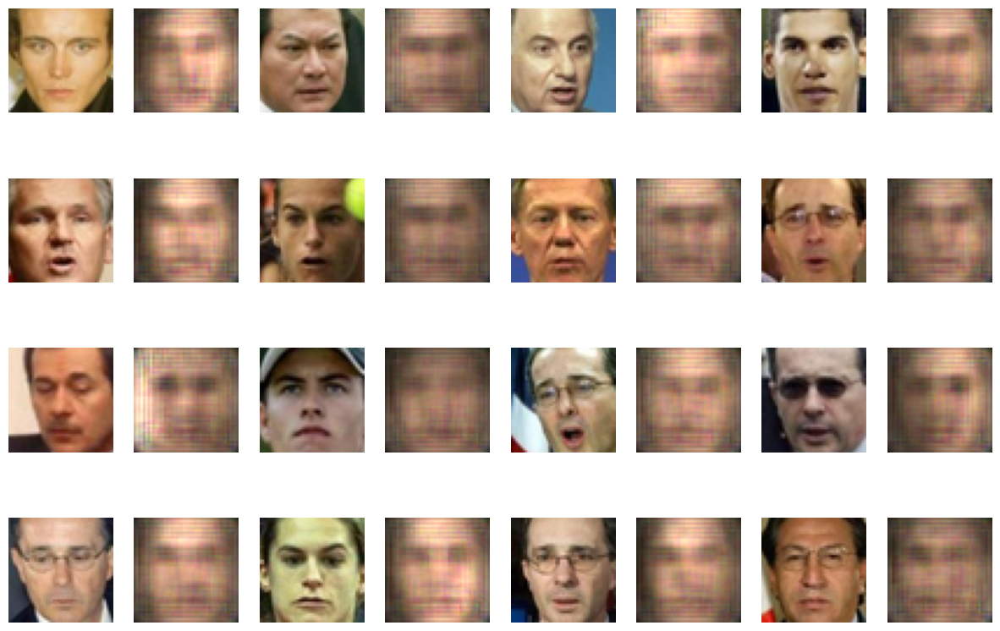

In [60]:
pic_output = AttributeShift(encoder_model,decoder_model,smile_data,no_smile_data)
PlotAttributeShift(no_smile_data,pic_output)

[Your markdown here]

**Method (what I implemented):**  
Given two groups that differ in one attribute (e.g., `smile_data` vs. `no_smile_data`), I:
1) Encoded each image to a latent code `z`.  
2) Computed the group means `μ_attr1` and `μ_attr2`.  
3) Formed an **attribute direction** `v = μ_attr1 - μ_attr2`.  
4) Shifted target images by `z' = z + v` and decoded `z'` to obtain the edited faces.  
(Implementation matches the required pipeline and uses the original latent space—not PCA.)

>  Using the encoder's **mean** (μ) rather than sampled codes generally yields cleaner edits; in practice this can be done by passing the μ-logσ² extractor model (from 1.3) as `encoder_model`.

---

**Results & observations (three attributes including smile):**

- **Smile (no-smile → smile):**  
  Edits tend to slightly lift mouth corners and brighten the lower-face region. Many results are **subtle** and remain **blurry**, but several examples show clear mouth curvature changes. Pairs with similar pose/lighting shift more convincingly.

- **Sunglasses (no-sunglasses → sunglasses):**  
  This shift sometimes darkens the eye region and thickens the frame area, but effects are **inconsistent**; some images only gain vague eye shadows. Visible improvements occur when the source has a clear frontal view and high-contrast eye area.

- **Male ↔ Female (gender-like cues):**  
  Changes in face contour/texture are **weak**; edited images look mostly like the original identity with minor softening or darkening. This attribute appears **hardest** to manipulate linearly with this VAE.

---

**Do the generated faces match expectations?**  
*Partly.* The model produces directionally reasonable edits for **smile** and sometimes **sunglasses**, but effects are often mild and lack sharp details—consistent with a low-resolution (45x45) VAE trained with pixel-wise MSE.

**Do edited faces still resemble the originals?**  
*Mostly yes* at a coarse level (pose, identity outline), but textures are washed out. When pose or illumination differs strongly from the mean groups, identity fidelity degrades.

**Which attribute shift is most successful? Why?**  
- **Most successful:** *Smile* → localized, high-signal change near the mouth that the encoder captures reasonably well.  
- **Less successful:** *Sunglasses* → partially captured; depends on frontal eyes and contrast.  
- **Least successful:** *Gender* → entangled and global; linear shift struggles without explicit disentanglement.

**Why aren't some edits strong/clean?**  
- **Entanglement:** Unsupervised VAE learns mixed factors; attribute directions are not axis-aligned.  
- **Sampling noise:** Using sampled `z` instead of μ adds variance to the shift.  
- **Capacity/resolution limits:** Small network + 45x45 inputs + MSE ⇒ blurry outputs, weak high-frequency edits.  
- **Linear shift in Euclidean space:** The straight line `z + v` can pass through low-density regions; spherical interp or normalized directions may help.  
- **Data imbalance:** Attribute groups may be small or biased (pose/lighting confounded with the attribute).

**Takeaways:**  
Simple VAEs can support coarse attribute manipulation via mean-difference vectors, but edits are subtle and blurry. Cleaner results typically require stronger disentanglement (e.g., β-VAE with larger β, supervised/contrastive signals), higher resolution, and using μ (not samples) for both computing the direction and applying the shift.


### 1.6 Generating new faces (3 points)

Variational autoencoders can be used to generate new data; this is why they are generative models. We can sample new data points from the distribution in latent space and reconstruct new, fake faces based on them.

To draw a sample close to an existing sample in the latent space, we can add a scaled random sample from the normal distribution to the latent space code of an existing sample. The scalar, which we call the `noise_level` is a parameter that we can tune.

Run `GenerateFaces` with three different values of `noise_level` and comment on the generated faces. (3 points)
* Do the generated images look like faces?
* What happens when the new samples diverge more from the existing samples? What is a possible reason?

In [61]:
def GenerateFaces(data, LATENT_SPACE_SIZE, noise_level):
    sample_index = random.sample(range(1, len(data)), 15)
    latent_space = noise_level*np.random.normal(size=(15,LATENT_SPACE_SIZE))+encoder_model.predict(data[sample_index])
    generated_image = decoder_model.predict(latent_space)
    fig = plt.figure(figsize=(15,10))
    for i in range(15):
        ax = fig.add_subplot(3, 5, i+1)
        ax.imshow(np.clip(generated_image[i, :,:,:],0,1))
        ax.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


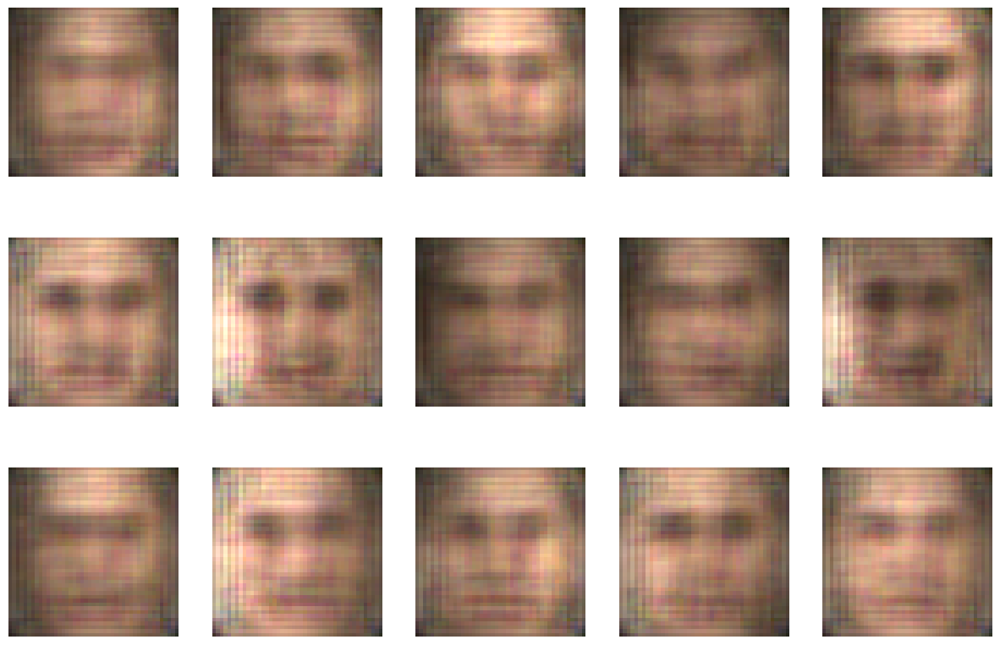

In [62]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


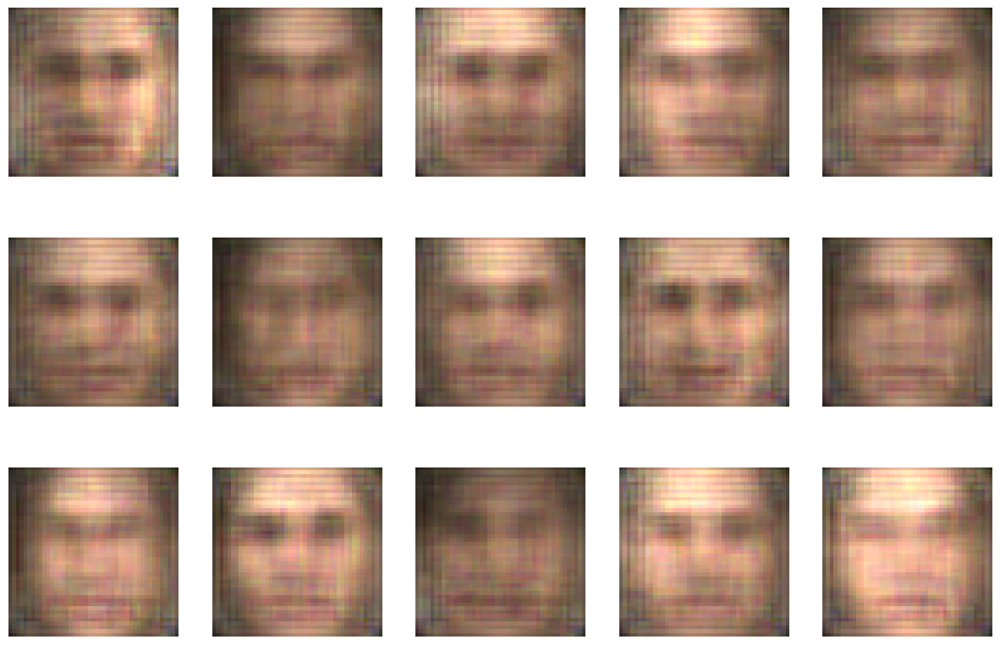

In [63]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


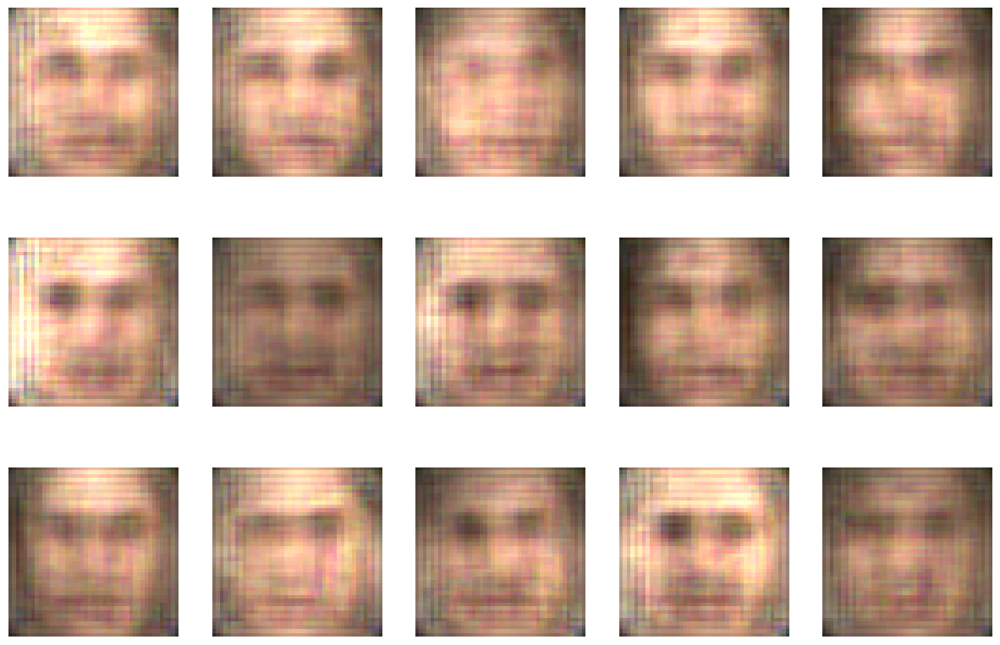

In [64]:
GenerateFaces(data,LATENT_SPACE_SIZE,1)

#### Do the generated images look like faces?
- **noise_level = 0.1** → Mostly **face-like**: coherent head shape, facial layout preserved; still blurry but clearly human.
- **noise_level = 0.5** → Quality **degrades**: many images remain face-like, yet features smear (eyes/mouth soften), occasional artifacts.
- **noise_level = 1.0** → Several samples become **ambiguous**: stronger blur/ghosting; some lose facial structure.

#### What happens as samples diverge more from existing ones? Why?
- As `noise_level` increases, samples move **farther from the data manifold** learned by the VAE.  
- The decoder then receives **off-manifold** latent codes and produces **averaged, low-confidence** outputs (blurry/unstable).  
- Additional reasons: limited decoder capacity and low input resolution (45x45) plus MSE loss bias toward mean-looking images.


### Optional: Changing the loss function (2 points extra credit)

The variable `factor` is a parameter of the loss function. In this optional problem, you will play with it and think about its effect on the performance of VAE.

Retrain the model with a smaller factor. Repeat 1.2, 1.6 (using `noise_level` = 1) and latent space visualization. Comment on how the reconstruction results, generated new faces and latent space distributions change. (2 points)
* Which model reconstructs the faces better?
* Do the generated faces look different?
* How do the latent variable distributions differ?
* Do the differences make sense? Can you explain what you observed?

In [ ]:
# Your code here

[Your markdown here]

## Problem 2: Gaussian neighborhood regression (10 points)
In multivariate Gaussians, edges are about *direct* relationships after controlling for all other variables. The conditional law of a single coordinate $X_i$ given the rest $X_{-i}$ reveals which variables directly “enter” the model for $X_i$. Algebraically, this local behavior is encoded by the $i$th row/column of the precision matrix $\Omega=\Sigma^{-1}$.  Graphical Lasso estimates a sparse precision matrix $\widehat{\Omega}$ by maximizing the Gaussian log-likelihood with an $\ell_1$ penalty on off-diagonal entries. Zeros in $\widehat{\Omega}$ correspond to missing edges (conditional independences) in the learned graph.



Let $X=(X_1,\dots,X_p)^\top \sim \mathcal N_p(0,\Sigma)$, and write $\Omega=\Sigma^{-1}$. For $i\in\{1,\dots,p\}$, denote $-i=\{1,\dots,p\}\setminus\{i\}$.




### 2.1 Conditional law of one node.
Show that $X_i\mid X_{-i}$ is Gaussian with a linear mean in $X_{-i}$. Express the regression coefficients $\beta_{i\leftarrow -i}\in\mathbb{R}^{p-1}$ and the conditional variance $\sigma^2_{i\mid -i}$ in terms of $\Omega$.


*Hint.* You may *complete the square* on $x^\top\Omega x$, or use a *Schur complement* derivation. After permuting coordinates so that $i$ is first, partition
$$
\Sigma \;=\; \begin{bmatrix}
a & b^\top \\[4pt]
b & C
\end{bmatrix},
\quad
a=\Sigma_{ii}\in\mathbb{R},\; b=\Sigma_{-i,i}\in\mathbb{R}^{p-1},\; C=\Sigma_{-i,-i}\in\mathbb{R}^{(p-1)\times(p-1)}.
$$
**Schur complement.** If $C$ is invertible (it is, since $\Sigma\succ 0$), the Schur complement of $C$ in $\Sigma$ is
$$
S \;:=\; a - b^\top C^{-1} b .
$$
**Block inversion formula.** Then
$$
\Sigma^{-1}
=\begin{bmatrix}
S^{-1} & -\,S^{-1} b^\top C^{-1}\\[4pt]
-\,C^{-1} b S^{-1} & C^{-1} + C^{-1} b S^{-1} b^\top C^{-1}
\end{bmatrix}.
$$

Let $X=(X_i, X_{-i})^\top \sim \mathcal N_p(0,\Sigma)$.  
After permuting so that the $i$-th coordinate is first, write  
$$
\Sigma=\begin{bmatrix}
a & b^\top\\
b & C
\end{bmatrix},
\qquad
a=\Sigma_{ii},\; b=\Sigma_{-i,i},\; C=\Sigma_{-i,-i}.
$$

---

#### (A) Conditional distribution via $\Sigma$
The standard Gaussian conditioning formula gives  
$$
X_i \mid X_{-i}\;\sim\; \mathcal N\!\big( \; b^\top C^{-1} X_{-i}\,,\; a - b^\top C^{-1} b \;\big).
$$
Thus the regression of $X_i$ on $X_{-i}$ has  

$$
\beta_{i\leftarrow -i}^{(\Sigma)} = C^{-1} b \in \mathbb{R}^{p-1}
$$
$$
\sigma^2_{i\mid -i} \;=\; \frac{1}{\Omega_{ii}}
$$


---

#### (B) Expressing the same quantities in terms of the precision $\Omega=\Sigma^{-1}$
Using the block inversion formula (with $S:=a-b^\top C^{-1}b$),
$$
\Omega=\Sigma^{-1}
=\begin{bmatrix}
S^{-1} & -\,S^{-1} b^\top C^{-1}\\[4pt]
-\,C^{-1} b S^{-1} & C^{-1}+C^{-1} b S^{-1} b^\top C^{-1}
\end{bmatrix}.
$$
From the upper-left and upper-right blocks we read
$$
\Omega_{ii}=S^{-1}\quad\Longrightarrow\quad S=\frac{1}{\Omega_{ii}},
\qquad
\Omega_{i,-i}=-\,S^{-1} b^\top C^{-1}=-\,\frac{1}{S}\, (b^\top C^{-1}).
$$
Therefore
$$
b^\top C^{-1} \;=\; -\,\frac{\Omega_{i,-i}}{\Omega_{ii}},
\qquad
a-b^\top C^{-1}b \;=\; S \;=\; \frac{1}{\Omega_{ii}}.
$$

---

#### (C) Final expressions (in terms of $\Omega$)
Hence the conditional law is Gaussian with linear mean:
$$
X_i \mid X_{-i} \;\sim\; \mathcal N\!\Big( \;\beta_{i\leftarrow -i}^\top X_{-i}\,,\; \sigma^2_{i\mid -i}\;\Big),
$$
where
$$
\boxed{\;\beta_{i\leftarrow -i} \;=\; -\,\frac{\Omega_{i,-i}}{\Omega_{ii}} \in \mathbb R^{p-1}\;},
\qquad
\boxed{\;\sigma^2_{i\mid -i} \;=\; \frac{1}{\Omega_{ii}}\;}.
$$
Zeros in $\Omega_{i,-i}$ correspond to zero coefficients in this local regression, i.e., missing edges (conditional independences) to node $i$.



### 2.2 One neighbor at a time.
Fix $j\neq i$. First prove that the coefficient of $X_j$ in the mean of $X_i \mid X_{-i}$ equals zero if and only if $\Omega_{ij}=0$. Then deduce (Gaussian case) that
$$\Omega_{ij}=0 \quad\Longleftrightarrow\quad X_i\ \perp\ X_j\ \big|\ X_{-(i,j)}.$$


*Hint:* Use the result from 2.1. *“iff” ($\Longleftrightarrow$) means:* prove **both** directions (⇒ and ⇐).  


From the conditional law derived in 2.1, we have:
$$
X_i \mid X_{-i} \sim \mathcal N\!\left(
-\,\frac{\Omega_{i,-i}}{\Omega_{ii}}\,X_{-i},\;
\frac{1}{\Omega_{ii}}
\right).
$$

The regression coefficient vector of $X_i$ on $X_{-i}$ is therefore:
$$
\beta_{i\leftarrow -i} = -\frac{\Omega_{i,-i}}{\Omega_{ii}}.
$$

---

#### (⇒) Direction

If $\Omega_{ij} = 0$, then the $j$-th component of $\Omega_{i,-i}$ is zero.  
Hence, the coefficient of $X_j$ in $\beta_{i\leftarrow -i}$ is zero,  
meaning that $X_j$ does **not** appear in the conditional mean of $X_i\mid X_{-i}$.

---

#### (⇐) Direction

Conversely, if the coefficient of $X_j$ in the conditional mean is zero,  
then the $j$-th component of $\beta_{i\leftarrow -i}$ must be zero,  
which implies $\Omega_{ij}=0$ from $\beta_{i\leftarrow -i} = -\Omega_{i,-i}/\Omega_{ii}$.

---

#### Conclusion

Therefore,
$$
\boxed{\;\Omega_{ij} = 0
\quad\Longleftrightarrow\quad
\text{the coefficient of } X_j \text{ in } \mathbb E[X_i\mid X_{-i}] \text{ is } 0.\;}
$$

By the Gaussian conditional independence property,
$$
\Omega_{ij}=0
\quad\Longleftrightarrow\quad
X_i\ \perp\ X_j\ \big|\ X_{-(i,j)}.
$$

This means that in a multivariate Gaussian model,  
zeros in the precision matrix $\Omega$ correspond exactly to **missing edges**  
(i.e., conditional independences) in the underlying graphical model.



### 2.3 Factorization and graph structure
Suppose every coefficient in the mean of $X_i\mid X_{-i}$ is zero (i.e., $\beta_{i\leftarrow -i}=0$). Show that the joint density factorizes as $p(x)=p(x_i)\,p(x_{-i})$. Briefly interpret the implication **for the graph structure**.

From 2.1, for a Gaussian $X\sim\mathcal N_p(0,\Sigma)$ with precision $\Omega=\Sigma^{-1}$,
$$
X_i \mid X_{-i} \sim \mathcal N\!\left(-\frac{\Omega_{i,-i}}{\Omega_{ii}}\,X_{-i},\; \frac{1}{\Omega_{ii}}\right),
\qquad
\beta_{i\leftarrow -i} = -\frac{\Omega_{i,-i}}{\Omega_{ii}}.
$$
If every coefficient in the mean is zero, i.e. $\beta_{i\leftarrow -i}=0$, then $\Omega_{i,-i}=0$ and hence
$$
p(x_i\mid x_{-i})=\mathcal N\!\left(0,\frac{1}{\Omega_{ii}}\right)\ \text{does not depend on }x_{-i}.
$$
Therefore
$$
p(x)=p(x_i\mid x_{-i})\,p(x_{-i})=p(x_i)\,p(x_{-i}).
$$

Equivalently, with $\Omega_{i,-i}=0$, the quadratic form in the joint density
$$
x^\top \Omega x \;=\; \Omega_{ii}x_i^2 \;+\; x_{-i}^\top \Omega_{-i,-i} x_{-i}
$$
has **no cross-term**, so the Gaussian density separates into a product in $x_i$ and $x_{-i}$.

**Graph interpretation.**  
$\Omega_{i,-i}=0$ means node $i$ has **no edges** to any other node. The graph splits into two disconnected components $\{i\}$ and $\{-i\}$, and the joint distribution factorizes across components.


## Problem 3: Taking stock (15 points)

A joint distribution of data has a natural graph associated with it. When the distribution is multivariate normal, this graph is encoded in the pattern of zeros and non-zeros in the inverse of the covariance matrix, also known as the "precision matrix."

In class we demonstrated the graphical lasso for estimating the graph on ETF data.
In this problem you will construct two different "portfolios" of stocks,
and run the graphical lasso to estimate a graph, commenting on your results.

All of the code you might need for this is contained in the demo.


## Data provided

As demonstrated in class, you will run on equities data downloaded from Yahoo Finance. Your job is to construct two “portfolios” of stocks, each with some organizing principle (e.g., sectors, regions, indices vs. equities). Each portfolio must contain **at least 20 stocks**. The page https://en.wikipedia.org/wiki/List_of_S%26P_500_companies has GICS sectors, which you may find useful for the glasso problem.


You are provided two CSV files containing stock prices **since 2021-09-10 (post-COVID start)**:
- [full_stock_daily.csv](https://raw.githubusercontent.com/YData123/sds365-fa25/main/assignments/assn3/full_stock_daily.csv) (rows = dates, columns = **ticker** symbols; daily close)
- [full_stock_weekly.csv](https://raw.githubusercontent.com/YData123/sds365-fa25/main/assignments/assn3/full_stock_weekly.csv) (rows = dates, columns = **ticker** symbols; weekly close = last available trading day of the week)

> **Note on NAs.** Some symbols begin trading after 2021-09-10, so their early entries will be `NA`. Handle missingness during preprocessing (see checklist below).  

> You can look up prices by ticker and date directly from these CSVs. If a needed symbol is **not** in the CSVs, use the provided **R file** `stock_price_from_yahoo_finance.r` to fetch it (via BatchGetSymbols) and merge it into your working data.

**Preprocessing checklist (concise):**
- Select your symbols; **align dates** across symbols.
- For the analysis window you choose, **filter** symbols with poor coverage (e.g., keep ≥90–95% non-missing).
- Build a **complete-cases** matrix for Graphical Lasso (no NAs across chosen symbols/dates).

### Analyzing  your portfolios

Your task is to analyze each porfolio using the graphical lasso, and comment on your findings.
Here are the types of questions you should address:

* How did you choose the portolio? How did you choose the date range and frequency (daily, weekly, etc.)? Remember, each of the portfolios must contain at least 20 stocks, and be organized in some reasonable way.

* Display the graph obtained with the graphical lasso, using networkx. How did you choose the regularization level? Does the structure of the graph make sense? Is it sensitive to the choice of regularization level? Is this the structure you expected to see when you designed the portfolio? Why or why not?

* What are some of the conditional independence assumptions implied by the graph? Are some parts of the graph more densely connected than others? Why?


